# Sentiment Classification & How To "Frame Problems" for a Neural Network

by Andrew Trask

- **Twitter**: @iamtrask
- **Blog**: http://iamtrask.github.io

### What You Should Already Know

- neural networks, forward and back-propagation
- stochastic gradient descent
- mean squared error
- and train/test splits

### Where to Get Help if You Need it
- Re-watch previous Udacity Lectures
- Leverage the recommended Course Reading Material - [Grokking Deep Learning](https://www.manning.com/books/grokking-deep-learning) (Check inside your classroom for a discount code)
- Shoot me a tweet @iamtrask


### Tutorial Outline:

- Intro: The Importance of "Framing a Problem" (this lesson)

- [Curate a Dataset](#lesson_1)
- [Developing a "Predictive Theory"](#lesson_2)
- [**PROJECT 1**: Quick Theory Validation](#project_1)


- [Transforming Text to Numbers](#lesson_3)
- [**PROJECT 2**: Creating the Input/Output Data](#project_2)


- Putting it all together in a Neural Network (video only - nothing in notebook)
- [**PROJECT 3**: Building our Neural Network](#project_3)


- [Understanding Neural Noise](#lesson_4)
- [**PROJECT 4**: Making Learning Faster by Reducing Noise](#project_4)


- [Analyzing Inefficiencies in our Network](#lesson_5)
- [**PROJECT 5**: Making our Network Train and Run Faster](#project_5)


- [Further Noise Reduction](#lesson_6)
- [**PROJECT 6**: Reducing Noise by Strategically Reducing the Vocabulary](#project_6)


- [Analysis: What's going on in the weights?](#lesson_7)

# Lesson: Curate a Dataset<a id='lesson_1'></a>
The cells from here until Project 1 include code Andrew shows in the videos leading up to mini project 1. We've included them so you can run the code along with the videos without having to type in everything.

In [202]:
def pretty_print_review_and_label(i):
    print(labels[i] + "\t:\t" + reviews[i][:80] + "...")

g = open('reviews.txt','r') # What we know!
reviews = list(map(lambda x:x[:-1],g.readlines()))
g.close()

g = open('labels.txt','r') # What we WANT to know!
labels = list(map(lambda x:x[:-1].upper(),g.readlines()))
g.close()

**Note:** The data in `reviews.txt` we're using has already been preprocessed a bit and contains only lower case characters. If we were working from raw data, where we didn't know it was all lower case, we would want to add a step here to convert it. That's so we treat different variations of the same word, like `The`, `the`, and `THE`, all the same way.

In [203]:
len(reviews)

25000

In [204]:
reviews[0]

'bromwell high is a cartoon comedy . it ran at the same time as some other programs about school life  such as  teachers  . my   years in the teaching profession lead me to believe that bromwell high  s satire is much closer to reality than is  teachers  . the scramble to survive financially  the insightful students who can see right through their pathetic teachers  pomp  the pettiness of the whole situation  all remind me of the schools i knew and their students . when i saw the episode in which a student repeatedly tried to burn down the school  i immediately recalled . . . . . . . . . at . . . . . . . . . . high . a classic line inspector i  m here to sack one of your teachers . student welcome to bromwell high . i expect that many adults of my age think that bromwell high is far fetched . what a pity that it isn  t   '

In [205]:
labels[0]

'POSITIVE'

# Lesson: Develop a Predictive Theory<a id='lesson_2'></a>

In [206]:
print("labels.txt \t : \t reviews.txt\n")
pretty_print_review_and_label(2137)
pretty_print_review_and_label(12816)
pretty_print_review_and_label(6267)
pretty_print_review_and_label(21934)
pretty_print_review_and_label(5297)
pretty_print_review_and_label(4998)

labels.txt 	 : 	 reviews.txt

NEGATIVE	:	this movie is terrible but it has some good effects .  ...
POSITIVE	:	adrian pasdar is excellent is this film . he makes a fascinating woman .  ...
NEGATIVE	:	comment this movie is impossible . is terrible  very improbable  bad interpretat...
POSITIVE	:	excellent episode movie ala pulp fiction .  days   suicides . it doesnt get more...
NEGATIVE	:	if you haven  t seen this  it  s terrible . it is pure trash . i saw this about ...
POSITIVE	:	this schiffer guy is a real genius  the movie is of excellent quality and both e...


# Project 1: Quick Theory Validation<a id='project_1'></a>

There are multiple ways to implement these projects, but in order to get your code closer to what Andrew shows in his solutions, we've provided some hints and starter code throughout this notebook.

You'll find the [Counter](https://docs.python.org/2/library/collections.html#collections.Counter) class to be useful in this exercise, as well as the [numpy](https://docs.scipy.org/doc/numpy/reference/) library.

In [301]:
from collections import Counter
import numpy as np

We'll create three `Counter` objects, one for words from postive reviews, one for words from negative reviews, and one for all the words.

In [208]:
# Create three Counter objects to store positive, negative and total counts
positive_counts = Counter()
negative_counts = Counter()
total_counts = Counter()

**TODO:** Examine all the reviews. For each word in a positive review, increase the count for that word in both your positive counter and the total words counter; likewise, for each word in a negative review, increase the count for that word in both your negative counter and the total words counter.

**Note:** Throughout these projects, you should use `split(' ')` to divide a piece of text (such as a review) into individual words. If you use `split()` instead, you'll get slightly different results than what the videos and solutions show.

In [209]:
# TODO: Loop over all the words in all the reviews and increment the counts in the appropriate counter objects
# if review is positive add to positive counts  and total counts
# ir review is negative add to negative counts and total counts

''' Using Counter
>>> # Tally occurrences of words in a list
>>> cnt = Counter()
>>> for word in ['red', 'blue', 'red', 'green', 'blue', 'blue']:
...     cnt[word] += 1
>>> cnt
Counter({'blue': 3, 'red': 2, 'green': 1})
'''
for i in range(len(reviews)):
    if labels[i]=='POSITIVE':
        for word in reviews[i].split(" "):
            positive_counts[word]+=1
            total_counts[word]+=1
    
    elif labels[i]=="NEGATIVE":
        for word in reviews[i].split(" "):
            negative_counts[word]+=1
            total_counts[word]+=1
    
    

Run the following two cells to list the words used in positive reviews and negative reviews, respectively, ordered from most to least commonly used. 

In [210]:
# Examine the counts of the most common words in positive reviews
positive_counts.most_common()

[('', 550468),
 ('the', 173324),
 ('.', 159654),
 ('and', 89722),
 ('a', 83688),
 ('of', 76855),
 ('to', 66746),
 ('is', 57245),
 ('in', 50215),
 ('br', 49235),
 ('it', 48025),
 ('i', 40743),
 ('that', 35630),
 ('this', 35080),
 ('s', 33815),
 ('as', 26308),
 ('with', 23247),
 ('for', 22416),
 ('was', 21917),
 ('film', 20937),
 ('but', 20822),
 ('movie', 19074),
 ('his', 17227),
 ('on', 17008),
 ('you', 16681),
 ('he', 16282),
 ('are', 14807),
 ('not', 14272),
 ('t', 13720),
 ('one', 13655),
 ('have', 12587),
 ('be', 12416),
 ('by', 11997),
 ('all', 11942),
 ('who', 11464),
 ('an', 11294),
 ('at', 11234),
 ('from', 10767),
 ('her', 10474),
 ('they', 9895),
 ('has', 9186),
 ('so', 9154),
 ('like', 9038),
 ('about', 8313),
 ('very', 8305),
 ('out', 8134),
 ('there', 8057),
 ('she', 7779),
 ('what', 7737),
 ('or', 7732),
 ('good', 7720),
 ('more', 7521),
 ('when', 7456),
 ('some', 7441),
 ('if', 7285),
 ('just', 7152),
 ('can', 7001),
 ('story', 6780),
 ('time', 6515),
 ('my', 6488),
 ('g

In [211]:
# Examine the counts of the most common words in negative reviews
negative_counts.most_common()

[('', 561462),
 ('.', 167538),
 ('the', 163389),
 ('a', 79321),
 ('and', 74385),
 ('of', 69009),
 ('to', 68974),
 ('br', 52637),
 ('is', 50083),
 ('it', 48327),
 ('i', 46880),
 ('in', 43753),
 ('this', 40920),
 ('that', 37615),
 ('s', 31546),
 ('was', 26291),
 ('movie', 24965),
 ('for', 21927),
 ('but', 21781),
 ('with', 20878),
 ('as', 20625),
 ('t', 20361),
 ('film', 19218),
 ('you', 17549),
 ('on', 17192),
 ('not', 16354),
 ('have', 15144),
 ('are', 14623),
 ('be', 14541),
 ('he', 13856),
 ('one', 13134),
 ('they', 13011),
 ('at', 12279),
 ('his', 12147),
 ('all', 12036),
 ('so', 11463),
 ('like', 11238),
 ('there', 10775),
 ('just', 10619),
 ('by', 10549),
 ('or', 10272),
 ('an', 10266),
 ('who', 9969),
 ('from', 9731),
 ('if', 9518),
 ('about', 9061),
 ('out', 8979),
 ('what', 8422),
 ('some', 8306),
 ('no', 8143),
 ('her', 7947),
 ('even', 7687),
 ('can', 7653),
 ('has', 7604),
 ('good', 7423),
 ('bad', 7401),
 ('would', 7036),
 ('up', 6970),
 ('only', 6781),
 ('more', 6730),
 ('

As you can see, common words like "the" appear very often in both positive and negative reviews. Instead of finding the most common words in positive or negative reviews, what you really want are the words found in positive reviews more often than in negative reviews, and vice versa. To accomplish this, you'll need to calculate the **ratios** of word usage between positive and negative reviews.

**TODO:** Check all the words you've seen and calculate the ratio of postive to negative uses and store that ratio in `pos_neg_ratios`. 
>Hint: the positive-to-negative ratio for a given word can be calculated with `positive_counts[word] / float(negative_counts[word]+1)`. Notice the `+1` in the denominator – that ensures we don't divide by zero for words that are only seen in positive reviews.

In [212]:
# Create Counter object to store positive/negative ratios

pos_neg_ratios = Counter()

# TODO: Calculate the ratios of positive and negative uses of the most common words
#       Consider words to be "common" if they've been used at least 100 times
###print(len(positive_counts))
for word in positive_counts:
    if positive_counts[word]>=100:
        pos_neg_ratios[word]=positive_counts[word] / float(negative_counts[word]+1)
    else:
        pass
    

Examine the ratios you've calculated for a few words:

In [213]:
print("Pos-to-neg ratio for 'the' = {}".format(pos_neg_ratios["the"]))
print("Pos-to-neg ratio for 'amazing' = {}".format(pos_neg_ratios["amazing"]))
print("Pos-to-neg ratio for 'terrible' = {}".format(pos_neg_ratios["terrible"]))

Pos-to-neg ratio for 'the' = 1.0607993145235326
Pos-to-neg ratio for 'amazing' = 4.022813688212928
Pos-to-neg ratio for 'terrible' = 0.17744252873563218


Looking closely at the values you just calculated, we see the following:

* Words that you would expect to see more often in positive reviews – like "amazing" – have a ratio greater than 1. The more skewed a word is toward postive, the farther from 1 its positive-to-negative ratio  will be.
* Words that you would expect to see more often in negative reviews – like "terrible" – have positive values that are less than 1. The more skewed a word is toward negative, the closer to zero its positive-to-negative ratio will be.
* Neutral words, which don't really convey any sentiment because you would expect to see them in all sorts of reviews – like "the" – have values very close to 1. A perfectly neutral word – one that was used in exactly the same number of positive reviews as negative reviews – would be almost exactly 1. The `+1` we suggested you add to the denominator slightly biases words toward negative, but it won't matter because it will be a tiny bias and later we'll be ignoring words that are too close to neutral anyway.

Ok, the ratios tell us which words are used more often in postive or negative reviews, but the specific values we've calculated are a bit difficult to work with. A very positive word like "amazing" has a value above 4, whereas a very negative word like "terrible" has a value around 0.18. Those values aren't easy to compare for a couple of reasons:

* Right now, 1 is considered neutral, but the absolute value of the postive-to-negative rations of very postive words is larger than the absolute value of the ratios for the very negative words. So there is no way to directly compare two numbers and see if one word conveys the same magnitude of positive sentiment as another word conveys negative sentiment. So we should center all the values around netural so the absolute value fro neutral of the postive-to-negative ratio for a word would indicate how much sentiment (positive or negative) that word conveys.
* When comparing absolute values it's easier to do that around zero than one. 

To fix these issues, we'll convert all of our ratios to new values using logarithms.

**TODO:** Go through all the ratios you calculated and convert them to logarithms. (i.e. use `np.log(ratio)`)

In the end, extremely positive and extremely negative words will have positive-to-negative ratios with similar magnitudes but opposite signs.

In [214]:
# TODO: Convert ratios to logs
pos_neg_ratios_log=Counter()
for word in pos_neg_ratios:
    pos_neg_ratios_log[word]=np.log(pos_neg_ratios[word])
    
#print(pos_neg_ratios_log['the'])

Examine the new ratios you've calculated for the same words from before:

In [215]:
print("Pos-to-neg ratio log for 'the' = {}".format(pos_neg_ratios_log["the"]))
print("Pos-to-neg ratio log for 'amazing' = {}".format(pos_neg_ratios_log["amazing"]))
print("Pos-to-neg ratio log for 'terrible' = {}".format(pos_neg_ratios_log["terrible"]))

Pos-to-neg ratio log for 'the' = 0.05902269426102881
Pos-to-neg ratio log for 'amazing' = 1.3919815802404802
Pos-to-neg ratio log for 'terrible' = -1.7291085042663878


If everything worked, now you should see neutral words with values close to zero. In this case, "the" is near zero but slightly positive, so it was probably used in more positive reviews than negative reviews. But look at "amazing"'s ratio - it's above `1`, showing it is clearly a word with positive sentiment. And "terrible" has a similar score, but in the opposite direction, so it's below `-1`. It's now clear that both of these words are associated with specific, opposing sentiments.

Now run the following cells to see more ratios. 

The first cell displays all the words, ordered by how associated they are with postive reviews. (Your notebook will most likely truncate the output so you won't actually see *all* the words in the list.)

The second cell displays the 30 words most associated with negative reviews by reversing the order of the first list and then looking at the first 30 words. (If you want the second cell to display all the words, ordered by how associated they are with negative reviews, you could just write `reversed(pos_neg_ratios.most_common())`.)

You should continue to see values similar to the earlier ones we checked – neutral words will be close to `0`, words will get more positive as their ratios approach and go above `1`, and words will get more negative as their ratios approach and go below `-1`. That's why we decided to use the logs instead of the raw ratios.

In [216]:
# words most frequently seen in a review with a "POSITIVE" label
pos_neg_ratios_log.most_common()

[('edie', 4.6913478822291435),
 ('paulie', 4.0775374439057197),
 ('felix', 3.1527360223636558),
 ('polanski', 2.8233610476132043),
 ('matthau', 2.8067217286092401),
 ('victoria', 2.6810215287142909),
 ('mildred', 2.6026896854443837),
 ('gandhi', 2.5389738710582761),
 ('flawless', 2.451005098112319),
 ('superbly', 2.2600254785752498),
 ('perfection', 2.1594842493533721),
 ('astaire', 2.1400661634962708),
 ('captures', 2.0386195471595809),
 ('wonderfully', 2.0218960560332353),
 ('powell', 1.9783454248084671),
 ('brosnan', 1.9547990964725592),
 ('lily', 1.9203768470501485),
 ('bakshi', 1.9029851043382795),
 ('lincoln', 1.9014583864844796),
 ('refreshing', 1.8551812956655511),
 ('breathtaking', 1.8481124057791867),
 ('bourne', 1.8478489358790986),
 ('delightful', 1.8002701588959635),
 ('flynn', 1.7996646487351682),
 ('andrews', 1.7764919970972666),
 ('beautifully', 1.7626953362841438),
 ('elvira', 1.7397031072720019),
 ('underrated', 1.7197859696029656),
 ('gripping', 1.7165360479904674),


In [217]:
# words most frequently seen in a review with a "NEGATIVE" label
list(reversed(pos_neg_ratios_log.most_common()))[0:30]

# Note: Above is the code Andrew uses in his solution video, 
#       so we've included it here to avoid confusion.
#       If you explore the documentation for the Counter class, 
#       you will see you could also find the 30 least common
#       words like this: pos_neg_ratios.most_common()[:-31:-1]

[('worst', -2.2869878961803778),
 ('awful', -2.2271942470274348),
 ('horrible', -1.9102590939512902),
 ('crap', -1.8281271133989299),
 ('worse', -1.7372712839439852),
 ('terrible', -1.7291085042663878),
 ('mess', -1.6900958154515549),
 ('stupid', -1.6552583827449077),
 ('dull', -1.5846733548097038),
 ('avoid', -1.5757955960158656),
 ('ridiculous', -1.5085119938441398),
 ('boring', -1.490978972730356),
 ('dumb', -1.4237207666390075),
 ('annoying', -1.3663932068025957),
 ('bad', -1.3562189073456823),
 ('unless', -1.351524161378173),
 ('fails', -1.3496303767482991),
 ('zombies', -1.3107868086117456),
 ('supposed', -1.2800917401491423),
 ('poor', -1.2704625455947689),
 ('fake', -1.2595426554807467),
 ('joke', -1.242506468328179),
 ('cheap', -1.2362810475585939),
 ('trash', -1.1118575154181303),
 ('oh', -1.0894379123920686),
 ('failed', -1.0658224658451187),
 ('bored', -1.056369983469809),
 ('painful', -1.0419933946686017),
 ('nowhere', -1.0277862360994972),
 ('predictable', -1.023596257428

# End of Project 1. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.

# Transforming Text into Numbers<a id='lesson_3'></a>
The cells here include code Andrew shows in the next video. We've included it so you can run the code along with the video without having to type in everything.

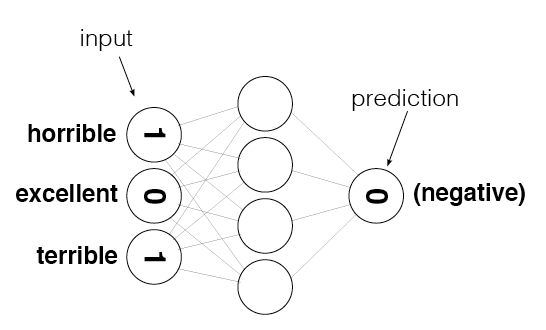

In [218]:
from IPython.display import Image

review = "This was a horrible, terrible movie."

Image(filename='sentiment_network.png')

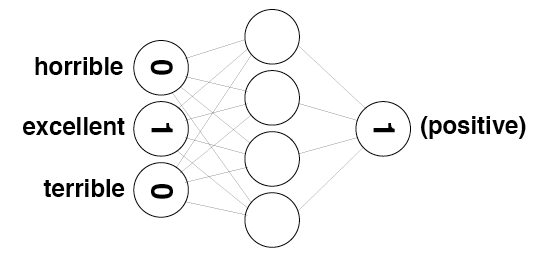

In [219]:
review = "The movie was excellent"

Image(filename='sentiment_network_pos.png')

# Project 2: Creating the Input/Output Data<a id='project_2'></a>

**TODO:** Create a [set](https://docs.python.org/3/tutorial/datastructures.html#sets) named `vocab` that contains every word in the vocabulary.

In [220]:
# TODO: Create set named "vocab" containing all of the words from all of the reviews
vocab = set()

for review in reviews:
    for word in review.split(" "):
        vocab.add(word)
    



Run the following cell to check your vocabulary size. If everything worked correctly, it should print **74074**

In [221]:
vocab_size = len(vocab)
print(vocab_size)

74074


Take a look at the following image. It represents the layers of the neural network you'll be building throughout this notebook. `layer_0` is the input layer, `layer_1` is a hidden layer, and `layer_2` is the output layer.

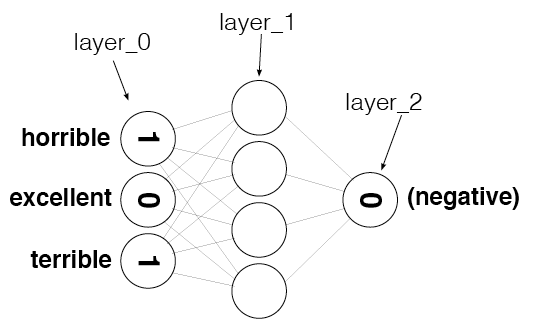

In [222]:
from IPython.display import Image
Image(filename='sentiment_network_2.png')

**TODO:** Create a numpy array called `layer_0` and initialize it to all zeros. You will find the [zeros](https://docs.scipy.org/doc/numpy/reference/generated/numpy.zeros.html) function particularly helpful here. Be sure you create `layer_0` as a 2-dimensional matrix with 1 row and `vocab_size` columns. 

In [223]:
# TODO: Create layer_0 matrix with dimensions 1 by vocab_size, initially filled with zeros
layer_0 = np.zeros((1,len(vocab)))

Run the following cell. It should display `(1, 74074)`

In [224]:
layer_0.shape

(1, 74074)

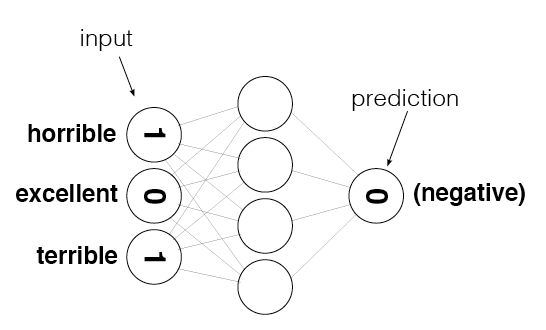

In [225]:
from IPython.display import Image
Image(filename='sentiment_network.png')

`layer_0` contains one entry for every word in the vocabulary, as shown in the above image. We need to make sure we know the index of each word, so run the following cell to create a lookup table that stores the index of every word.

In [226]:
# Create a dictionary of words in the vocabulary mapped to index positions
# (to be used in layer_0)
word2index = {}
for i,word in enumerate(vocab):
    word2index[word] = i
    
# display the map of words to indices
word2index
len(word2index)

74074

**TODO:**  Complete the implementation of `update_input_layer`. It should count 
          how many times each word is used in the given review, and then store
          those counts at the appropriate indices inside `layer_0`.

In [227]:
def update_input_layer(review):
    """ Modify the global layer_0 to represent the vector form of review.
    The element at a given index of layer_0 should represent
    how many times the given word occurs in the review.
    Args:
        review(string) - the string of the review
    Returns:
        None
    """
    global layer_0
    # clear out previous state by resetting the layer to be all 0s
    layer_0 *= 0
    
    # TODO: count how many times each word is used in the given review and store the results in layer_0
   
    for word in review.split(" "):
        layer_0[0,word2index[word]]+=1
    
            


Run the following cell to test updating the input layer with the first review. The indices assigned may not be the same as in the solution, but hopefully you'll see some non-zero values in `layer_0`.  

In [228]:
update_input_layer(reviews[0])
layer_0

array([[ 18.,   0.,   0., ...,   0.,   0.,   0.]])

**TODO:** Complete the implementation of `get_target_for_labels`. It should return `0` or `1`, 
          depending on whether the given label is `NEGATIVE` or `POSITIVE`, respectively.

In [229]:
def get_target_for_label(label):
    """Convert a label to `0` or `1`.
    Args:
        label(string) - Either "POSITIVE" or "NEGATIVE".
    Returns:
        `0` or `1`.
    """
    # TODO: Your code here
    if label == "POSITIVE":
        return 1
    else:
        return 0
    

Run the following two cells. They should print out`'POSITIVE'` and `1`, respectively.

In [230]:
labels[0]

'POSITIVE'

In [231]:
get_target_for_label(labels[0])

1

Run the following two cells. They should print out `'NEGATIVE'` and `0`, respectively.

In [232]:
labels[1]

'NEGATIVE'

In [233]:
get_target_for_label(labels[1])

0

# End of Project 2. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.

# Project 3: Building a Neural Network<a id='project_3'></a>

**TODO:** We've included the framework of a class called `SentimentNetork`. Implement all of the items marked `TODO` in the code. These include doing the following:
- Create a basic neural network much like the networks you've seen in earlier lessons and in Project 1, with an input layer, a hidden layer, and an output layer. 
- Do **not** add a non-linearity in the hidden layer. That is, do not use an activation function when calculating the hidden layer outputs.
- Re-use the code from earlier in this notebook to create the training data (see `TODO`s in the code)
- Implement the `pre_process_data` function to create the vocabulary for our training data generating functions
- Ensure `train` trains over the entire corpus

### Where to Get Help if You Need it
- Re-watch earlier Udacity lectures
- Chapters 3-5 - [Grokking Deep Learning](https://www.manning.com/books/grokking-deep-learning) - (Check inside your classroom for a discount code)

In [234]:
import time
import sys
import numpy as np

# Encapsulate our neural network in a class
class SentimentNetwork:
    def __init__(self, reviews, labels, hidden_nodes = 10, learning_rate = 0.1):
        """Create a SentimenNetwork with the given settings
        Args:
            reviews(list) - List of reviews used for training
            labels(list) - List of POSITIVE/NEGATIVE labels associated with the given reviews
            hidden_nodes(int) - Number of nodes to create in the hidden layer
            learning_rate(float) - Learning rate to use while training
        
        """
        # Assign a seed to our random number generator to ensure we get
        # reproducable results during development 
        np.random.seed(1)

        # process the reviews and their associated labels so that everything
        # is ready for training
        self.pre_process_data(reviews, labels)
        
        # Build the network to have the number of hidden nodes and the learning rate that
        # were passed into this initializer. Make the same number of input nodes as
        # there are vocabulary words and create a single output node.
        self.init_network(len(self.review_vocab),hidden_nodes, 1, learning_rate)

    def pre_process_data(self, reviews, labels):
        
        review_vocab = set()
        for review in reviews:
            for word in review.split(" "):
                review_vocab.add(word)


        # TODO: populate review_vocab with all of the words in the given reviews
        #       Remember to split reviews into individual words 
        #       using "split(' ')" instead of "split()".
        #MC: DONE
        
        # Convert the vocabulary set to a list so we can access words via indices
        self.review_vocab = list(review_vocab)
        
        label_vocab = set()
        for label in labels:
            label_vocab.add(label)
            
            
        # TODO: populate label_vocab with all of the words in the given labels.
        #       There is no need to split the labels because each one is a single word.
        
        # Convert the label vocabulary set to a list so we can access labels via indices
        self.label_vocab = list(label_vocab)
        
        # Store the sizes of the review and label vocabularies.
        self.review_vocab_size = len(self.review_vocab)
        self.label_vocab_size = len(self.label_vocab)
        
        # Create a dictionary of words in the vocabulary mapped to index positions
        self.word2index = {}
        for i,word in enumerate(self.review_vocab):
            self.word2index[word] = i
        # TODO: populate self.word2index with indices for all the words in self.review_vocab
        #       like you saw earlier in the notebook
        
        # Create a dictionary of labels mapped to index positions
        self.label2index = {}
        for i,word in enumerate(self.label_vocab):
            self.label2index[word] = i
        # TODO: do the same thing you did for self.word2index and self.review_vocab, 
        #       but for self.label2index and self.label_vocab instead
         
        
    def init_network(self, input_nodes, hidden_nodes, output_nodes, learning_rate):
        # Store the number of nodes in input, hidden, and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Store the learning rate
        self.learning_rate = learning_rate

        # Initialize weights
        
        # TODO: initialize self.weights_0_1 as a matrix of zeros. These are the weights between
        #       the input layer and the hidden layer.
        self.weights_0_1 = np.zeros((self.input_nodes,self.hidden_nodes))
        
        # TODO: initialize self.weights_1_2 as a matrix of random values. 
        #       These are the weights between the hidden layer and the output layer.
        self.weights_1_2 = np.random.normal(0.0, self.output_nodes**-0.5,(self.hidden_nodes,self.output_nodes))
        
        # TODO: Create the input layer, a two-dimensional matrix with shape 
        #       1 x input_nodes, with all values initialized to zero
        self.layer_0 = np.zeros((1,input_nodes))
    
        
    def update_input_layer(self,review):
        # TODO: You can copy most of the code you wrote for update_input_layer 
        #       earlier in this notebook. 
        #
    
         
         
            
        # clear out previous state by resetting the layer to be all 0s
        self.layer_0 *= 0
        # TODO: count how many times each word is used in the given review and store the results in layer_0
        for word in review.split(" "):
            if(word in self.word2index.keys()):
                self.layer_0[0][self.word2index[word]]+=1
        #       However, MAKE SURE YOU CHANGE ALL VARIABLES TO REFERENCE
        #       THE VERSIONS STORED IN THIS OBJECT, NOT THE GLOBAL OBJECTS.
        #       For example, replace "layer_0 *= 0" with "self.layer_0 *= 0"
       
                
    def get_target_for_label(self,label):
        
        if label == "POSITIVE":
            return 1
        else:
            return 0
        # TODO: Copy the code you wrote for get_target_for_label 
        #       earlier in this notebook. 
        
        
    def sigmoid(self,x):
        return 1/(1+np.exp(-x))
        # TODO: Return the result of calculating the sigmoid activation function
        #       shown in the lectures
        
    
    def sigmoid_output_2_derivative(self,output):
        return output*(1- output)
        # TODO: Return the derivative of the sigmoid activation function, 
        #       where "output" is the original output from the sigmoid fucntion 
        

    def train(self, training_reviews, training_labels):
        
        # make sure out we have a matching number of reviews and labels
        assert(len(training_reviews) == len(training_labels))
        
        # Keep track of correct predictions to display accuracy during training 
        correct_so_far = 0
        
        # Remember when we started for printing time statistics
        start = time.time()

        # loop through all the given reviews and run a forward and backward pass,
        # updating weights for every item
        for i in range(len(training_reviews)):
            
            # TODO: Get the next review and its correct label
            review=training_reviews[i]
            label=training_labels[i]
            
            
            
            
            
            # TODO: Implement the forward pass through the network. 
            #       That means use the given review to update the input layer, 
            #       then calculate values for the hidden layer,
            #       and finally calculate the output layer.
            
            
            #       Do not use an activation function for the hidden layer,
            #       but use the sigmoid activation function for the output layer.
            self.update_input_layer(review)
            target=self.get_target_for_label(label)
            
            hidden_outputs=self.layer_0.dot(self.weights_0_1)
        
            final_outputs=self.sigmoid(hidden_outputs.dot(self.weights_1_2))
       
        
            
            
            # TODO: Implement the back propagation pass here. 
            #       That means calculate the error for the forward pass's prediction
            #       and update the weights in the network according to their
            #       contributions toward the error, as calculated via the
            #       gradient descent and back propagation algorithms you 
            #       learned in class.
            
            #output_layer_error
            error=final_outputs-target
            output_error_term=error*self.sigmoid_output_2_derivative(final_outputs)
            
            #hidden_layer_error
            hidden_error=np.dot(output_error_term,self.weights_1_2.T)
            hidden_error_term=hidden_error
            
            #weights_update
            self.weights_1_2-=hidden_outputs.T.dot(output_error_term)*self.learning_rate
            self.weights_0_1-=self.layer_0.T.dot(hidden_error_term)*self.learning_rate
            
            
                
            
            # TODO: Keep track of correct predictions. To determine if the prediction was
            #       correct, check that the absolute value of the output error 
            #       is less than 0.5. If so, add one to the correct_so_far count.
            
            
            if np.abs(error) < 0.5:
                correct_so_far += 1
            '''if(final_outputs >= 0.5 and label == 'POSITIVE'):
                correct_so_far += 1
            elif(final_outputs < 0.5 and label == 'NEGATIVE'):
                correct_so_far += 1
            '''
            
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the training process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(training_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct_so_far) + " #Trained:" + str(i+1) \
                             + " Training Accuracy:" + str(correct_so_far * 100 / float(i+1))[:4] + "%")
            if(i % 2500 == 0):
                print("")
    
    def test(self, testing_reviews, testing_labels):
        """
        Attempts to predict the labels for the given testing_reviews,
        and uses the test_labels to calculate the accuracy of those predictions.
        """
        
        # keep track of how many correct predictions we make
        correct = 0

        # we'll time how many predictions per second we make
        start = time.time()

        # Loop through each of the given reviews and call run to predict
        # its label. 
        for i in range(len(testing_reviews)):
            pred = self.run(testing_reviews[i])
            if(pred == testing_labels[i]):
                correct += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the prediction process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(testing_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct) + " #Tested:" + str(i+1) \
                             + " Testing Accuracy:" + str(correct * 100 / float(i+1))[:4] + "%")
    
    def run(self, review):
        """
        Returns a POSITIVE or NEGATIVE prediction for the given review.
        """
        # TODO: Run a forward pass through the network, like you did in the
        #       "train" function. That means use the given review to 
        #       update the input layer, then calculate values for the hidden layer,
        #       and finally calculate the output layer.
        
        self.update_input_layer(review.lower())
        
            
        hidden_outputs=self.layer_0.dot(self.weights_0_1)
        #hidden_outputs=hidden_inputs
        final_outputs=self.sigmoid(hidden_outputs.dot(self.weights_1_2))
        #
        #       Note: The review passed into this function for prediction 
        #             might come from anywhere, so you should convert it 
        #             to lower case prior to using it.
        
        # TODO: The output layer should now contain a prediction. 
        #       Return `POSITIVE` for predictions greater-than-or-equal-to `0.5`, 
        #       and `NEGATIVE` otherwise.
        if(final_outputs[0] >= 0.5):
            return "POSITIVE"
        else:
            return "NEGATIVE"
    
        
        


Run the following cell to create a `SentimentNetwork` that will train on all but the last 1000 reviews (we're saving those for testing). Here we use a learning rate of `0.1`.

In [235]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.1)

Run the following cell to test the network's performance against the last 1000 reviews (the ones we held out from our training set). 

**We have not trained the model yet, so the results should be about 50% as it will just be guessing and there are only two possible values to choose from.**

In [236]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:11.4% Speed(reviews/sec):454.6 #Correct:58 #Tested:115 Testing Accuracy:50.4%

Progress:24.1% Speed(reviews/sec):533.8 #Correct:121 #Tested:242 Testing Accuracy:50.0%

Progress:37.9% Speed(reviews/sec):579.9 #Correct:190 #Tested:380 Testing Accuracy:50.0%

Progress:50.9% Speed(reviews/sec):595.3 #Correct:255 #Tested:510 Testing Accuracy:50.0%

Progress:64.4% Speed(reviews/sec):609.1 #Correct:323 #Tested:645 Testing Accuracy:50.0%

Progress:77.7% Speed(reviews/sec):616.8 #Correct:389 #Tested:778 Testing Accuracy:50.0%

Progress:90.3% Speed(reviews/sec):617.6 #Correct:452 #Tested:904 Testing Accuracy:50.0%

Progress:99.9% Speed(reviews/sec):614.4 #Correct:500 #Tested:1000 Testing Accuracy:50.0%

Run the following cell to actually train the network. During training, it will display the model's accuracy repeatedly as it trains so you can see how well it's doing.

In [49]:
mlp.train(reviews[:-1000],labels[:-1000])

Progress:0.0% Speed(reviews/sec):0.0 #Correct:0 #Trained:1 Training Accuracy:0.0%
Progress:4.07% Speed(reviews/sec):148.3 #Correct:489 #Trained:979 Training Accuracy:49.9%

KeyboardInterrupt: 

That most likely didn't train very well. Part of the reason may be because the learning rate is too high. Run the following cell to recreate the network with a smaller learning rate, `0.01`, and then train the new network.

In [316]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.01)
mlp.train(reviews[:-1000],labels[:-1000])

Progress:0.0% Speed(reviews/sec):0.0 #Correct:0 #Trained:1 Training Accuracy:0.0%
Progress:10.4% Speed(reviews/sec):114.9 #Correct:1250 #Trained:2501 Training Accuracy:49.9%
Progress:20.8% Speed(reviews/sec):117.7 #Correct:2500 #Trained:5001 Training Accuracy:49.9%
Progress:31.2% Speed(reviews/sec):120.2 #Correct:3750 #Trained:7501 Training Accuracy:49.9%
Progress:41.6% Speed(reviews/sec):121.8 #Correct:5000 #Trained:10001 Training Accuracy:49.9%
Progress:52.0% Speed(reviews/sec):123.2 #Correct:6250 #Trained:12501 Training Accuracy:49.9%
Progress:62.5% Speed(reviews/sec):123.9 #Correct:7500 #Trained:15001 Training Accuracy:49.9%
Progress:72.9% Speed(reviews/sec):124.4 #Correct:8750 #Trained:17501 Training Accuracy:49.9%
Progress:83.3% Speed(reviews/sec):124.8 #Correct:10000 #Trained:20001 Training Accuracy:49.9%
Progress:93.7% Speed(reviews/sec):125.3 #Correct:11250 #Trained:22501 Training Accuracy:49.9%
Progress:99.9% Speed(reviews/sec):125.4 #Correct:12000 #Trained:24000 Training Acc

That probably wasn't much different. Run the following cell to recreate the network one more time with an even smaller learning rate, `0.001`, and then train the new network.

In [53]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.0001)
mlp.train(reviews[:-1000],labels[:-1000])

Progress:0.0% Speed(reviews/sec):0.0 #Correct:0 #Trained:1 Training Accuracy:0.0%
Progress:10.4% Speed(reviews/sec):154.3 #Correct:1250 #Trained:2501 Training Accuracy:49.9%
Progress:20.8% Speed(reviews/sec):154.3 #Correct:2500 #Trained:5001 Training Accuracy:49.9%
Progress:31.2% Speed(reviews/sec):153.9 #Correct:3750 #Trained:7501 Training Accuracy:49.9%
Progress:41.6% Speed(reviews/sec):150.4 #Correct:5000 #Trained:10001 Training Accuracy:49.9%
Progress:52.0% Speed(reviews/sec):148.0 #Correct:6250 #Trained:12501 Training Accuracy:49.9%
Progress:62.5% Speed(reviews/sec):144.7 #Correct:7500 #Trained:15001 Training Accuracy:49.9%
Progress:72.9% Speed(reviews/sec):141.7 #Correct:8750 #Trained:17501 Training Accuracy:49.9%
Progress:83.3% Speed(reviews/sec):141.5 #Correct:10000 #Trained:20001 Training Accuracy:49.9%
Progress:93.7% Speed(reviews/sec):142.0 #Correct:11250 #Trained:22501 Training Accuracy:49.9%
Progress:99.9% Speed(reviews/sec):142.4 #Correct:12000 #Trained:24000 Training Acc

With a learning rate of `0.001`, the network should finall have started to improve during training. It's still not very good, but it shows that this solution has potential. We will improve it in the next lesson.

# End of Project 3. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.

# Understanding Neural Noise<a id='lesson_4'></a>

The following cells include includes the code Andrew shows in the next video. We've included it here so you can run the cells along with the video without having to type in everything.

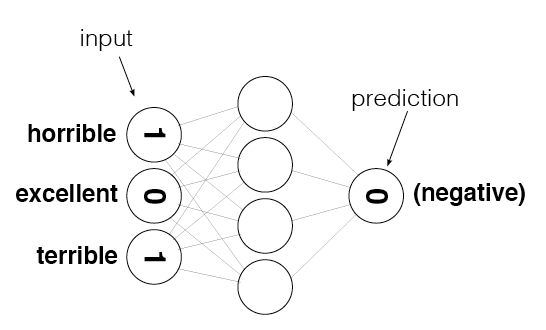

In [69]:
from IPython.display import Image
Image(filename='sentiment_network.png')

In [237]:
def update_input_layer(review):
    
    global layer_0
    
    # clear out previous state, reset the layer to be all 0s
    layer_0 *= 0
    for word in review.split(" "):
        layer_0[0][word2index[word]] += 1

update_input_layer(reviews[0])

In [102]:
layer_0

array([[ 18.,   0.,   0., ...,   0.,   0.,   0.]])

In [103]:
review_counter = Counter()

In [104]:
for word in reviews[0].split(" "):
    review_counter[word] += 1

In [105]:
review_counter.most_common()

[('.', 27),
 ('', 18),
 ('the', 9),
 ('to', 6),
 ('high', 5),
 ('i', 5),
 ('bromwell', 4),
 ('is', 4),
 ('a', 4),
 ('teachers', 4),
 ('that', 4),
 ('of', 4),
 ('it', 2),
 ('at', 2),
 ('as', 2),
 ('school', 2),
 ('my', 2),
 ('in', 2),
 ('me', 2),
 ('students', 2),
 ('their', 2),
 ('student', 2),
 ('cartoon', 1),
 ('comedy', 1),
 ('ran', 1),
 ('same', 1),
 ('time', 1),
 ('some', 1),
 ('other', 1),
 ('programs', 1),
 ('about', 1),
 ('life', 1),
 ('such', 1),
 ('years', 1),
 ('teaching', 1),
 ('profession', 1),
 ('lead', 1),
 ('believe', 1),
 ('s', 1),
 ('satire', 1),
 ('much', 1),
 ('closer', 1),
 ('reality', 1),
 ('than', 1),
 ('scramble', 1),
 ('survive', 1),
 ('financially', 1),
 ('insightful', 1),
 ('who', 1),
 ('can', 1),
 ('see', 1),
 ('right', 1),
 ('through', 1),
 ('pathetic', 1),
 ('pomp', 1),
 ('pettiness', 1),
 ('whole', 1),
 ('situation', 1),
 ('all', 1),
 ('remind', 1),
 ('schools', 1),
 ('knew', 1),
 ('and', 1),
 ('when', 1),
 ('saw', 1),
 ('episode', 1),
 ('which', 1),
 ('r

# Project 4: Reducing Noise in Our Input Data<a id='project_4'></a>

**TODO:** Attempt to reduce the noise in the input data like Andrew did in the previous video. Specifically, do the following:
* Copy the `SentimentNetwork` class you created earlier into the following cell.
* Modify `update_input_layer` so it does not count how many times each word is used, but rather just stores whether or not a word was used. 

In [106]:
# TODO: -Copy the SentimentNetwork class from Projet 3 lesson
#       -Modify it to reduce noise, like in the video 


In [239]:
import time
import sys
import numpy as np

# Encapsulate our neural network in a class
class SentimentNetwork:
    def __init__(self, reviews, labels, hidden_nodes = 10, learning_rate = 0.1):
        """Create a SentimenNetwork with the given settings
        Args:
            reviews(list) - List of reviews used for training
            labels(list) - List of POSITIVE/NEGATIVE labels associated with the given reviews
            hidden_nodes(int) - Number of nodes to create in the hidden layer
            learning_rate(float) - Learning rate to use while training
        
        """
        # Assign a seed to our random number generator to ensure we get
        # reproducable results during development 
        np.random.seed(1)

        # process the reviews and their associated labels so that everything
        # is ready for training
        self.pre_process_data(reviews, labels)
        
        # Build the network to have the number of hidden nodes and the learning rate that
        # were passed into this initializer. Make the same number of input nodes as
        # there are vocabulary words and create a single output node.
        self.init_network(len(self.review_vocab),hidden_nodes, 1, learning_rate)

    def pre_process_data(self, reviews, labels):
        
        review_vocab = set()
        for review in reviews:
            for word in review.split(" "):
                review_vocab.add(word)


        # TODO: populate review_vocab with all of the words in the given reviews
        #       Remember to split reviews into individual words 
        #       using "split(' ')" instead of "split()".
        #MC: DONE
        
        # Convert the vocabulary set to a list so we can access words via indices
        self.review_vocab = list(review_vocab)
        
        label_vocab = set()
        for label in labels:
            label_vocab.add(label)
            
            
        # TODO: populate label_vocab with all of the words in the given labels.
        #       There is no need to split the labels because each one is a single word.
        
        # Convert the label vocabulary set to a list so we can access labels via indices
        self.label_vocab = list(label_vocab)
        
        # Store the sizes of the review and label vocabularies.
        self.review_vocab_size = len(self.review_vocab)
        self.label_vocab_size = len(self.label_vocab)
        
        # Create a dictionary of words in the vocabulary mapped to index positions
        self.word2index = {}
        for i,word in enumerate(self.review_vocab):
            self.word2index[word] = i
        # TODO: populate self.word2index with indices for all the words in self.review_vocab
        #       like you saw earlier in the notebook
        
        # Create a dictionary of labels mapped to index positions
        self.label2index = {}
        for i,word in enumerate(self.label_vocab):
            self.label2index[word] = i
        # TODO: do the same thing you did for self.word2index and self.review_vocab, 
        #       but for self.label2index and self.label_vocab instead
         
        
    def init_network(self, input_nodes, hidden_nodes, output_nodes, learning_rate):
        # Store the number of nodes in input, hidden, and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Store the learning rate
        self.learning_rate = learning_rate

        # Initialize weights
        
        # TODO: initialize self.weights_0_1 as a matrix of zeros. These are the weights between
        #       the input layer and the hidden layer.
        self.weights_0_1 = np.zeros((self.input_nodes,self.hidden_nodes))
        
        # TODO: initialize self.weights_1_2 as a matrix of random values. 
        #       These are the weights between the hidden layer and the output layer.
        self.weights_1_2 = np.random.normal(0.0, self.output_nodes**-0.5,(self.hidden_nodes,self.output_nodes))
        
        # TODO: Create the input layer, a two-dimensional matrix with shape 
        #       1 x input_nodes, with all values initialized to zero
        self.layer_0 = np.zeros((1,input_nodes))
    
        
    def update_input_layer(self,review):
        # TODO: You can copy most of the code you wrote for update_input_layer 
        #       earlier in this notebook. 
        #
    
         
         
            
        # clear out previous state by resetting the layer to be all 0s
        self.layer_0 *= 0
        # TODO: count how many times each word is used in the given review and store the results in layer_0
        for word in review.split(" "):
            if(word in self.word2index.keys()):
                self.layer_0[0][self.word2index[word]]=1
        #       However, MAKE SURE YOU CHANGE ALL VARIABLES TO REFERENCE
        #       THE VERSIONS STORED IN THIS OBJECT, NOT THE GLOBAL OBJECTS.
        #       For example, replace "layer_0 *= 0" with "self.layer_0 *= 0"
       
                
    def get_target_for_label(self,label):
        
        if label == "POSITIVE":
            return 1
        else:
            return 0
        # TODO: Copy the code you wrote for get_target_for_label 
        #       earlier in this notebook. 
        
        
    def sigmoid(self,x):
        return 1/(1+np.exp(-x))
        # TODO: Return the result of calculating the sigmoid activation function
        #       shown in the lectures
        
    
    def sigmoid_output_2_derivative(self,output):
        return output*(1- output)
        # TODO: Return the derivative of the sigmoid activation function, 
        #       where "output" is the original output from the sigmoid fucntion 
        

    def train(self, training_reviews, training_labels):
        
        # make sure out we have a matching number of reviews and labels
        assert(len(training_reviews) == len(training_labels))
        
        # Keep track of correct predictions to display accuracy during training 
        correct_so_far = 0
        
        # Remember when we started for printing time statistics
        start = time.time()

        # loop through all the given reviews and run a forward and backward pass,
        # updating weights for every item
        for i in range(len(training_reviews)):
            
            # TODO: Get the next review and its correct label
            review=training_reviews[i]
            label=training_labels[i]
            
            
            
            
            
            # TODO: Implement the forward pass through the network. 
            #       That means use the given review to update the input layer, 
            #       then calculate values for the hidden layer,
            #       and finally calculate the output layer.
            
            
            #       Do not use an activation function for the hidden layer,
            #       but use the sigmoid activation function for the output layer.
            self.update_input_layer(review)
            target=self.get_target_for_label(label)
            
            hidden_outputs=self.layer_0.dot(self.weights_0_1)
        
            final_outputs=self.sigmoid(hidden_outputs.dot(self.weights_1_2))
       
        
            
            
            # TODO: Implement the back propagation pass here. 
            #       That means calculate the error for the forward pass's prediction
            #       and update the weights in the network according to their
            #       contributions toward the error, as calculated via the
            #       gradient descent and back propagation algorithms you 
            #       learned in class.
            
            #output_layer_error
            error=final_outputs-target
            output_error_term=error*self.sigmoid_output_2_derivative(final_outputs)
            
            #hidden_layer_error
            hidden_error=np.dot(output_error_term,self.weights_1_2.T)
            hidden_error_term=hidden_error
            
            #weights_update
            self.weights_1_2-=hidden_outputs.T.dot(output_error_term)*self.learning_rate
            self.weights_0_1-=self.layer_0.T.dot(hidden_error_term)*self.learning_rate
            
            
                
            
            # TODO: Keep track of correct predictions. To determine if the prediction was
            #       correct, check that the absolute value of the output error 
            #       is less than 0.5. If so, add one to the correct_so_far count.
            
            
            if np.abs(error) < 0.5:
                correct_so_far += 1
            '''if(final_outputs >= 0.5 and label == 'POSITIVE'):
                correct_so_far += 1
            elif(final_outputs < 0.5 and label == 'NEGATIVE'):
                correct_so_far += 1
            '''
            
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the training process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(training_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct_so_far) + " #Trained:" + str(i+1) \
                             + " Training Accuracy:" + str(correct_so_far * 100 / float(i+1))[:4] + "%")
            if(i % 2500 == 0):
                print("")
    
    def test(self, testing_reviews, testing_labels):
        """
        Attempts to predict the labels for the given testing_reviews,
        and uses the test_labels to calculate the accuracy of those predictions.
        """
        
        # keep track of how many correct predictions we make
        correct = 0

        # we'll time how many predictions per second we make
        start = time.time()

        # Loop through each of the given reviews and call run to predict
        # its label. 
        for i in range(len(testing_reviews)):
            pred = self.run(testing_reviews[i])
            if(pred == testing_labels[i]):
                correct += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the prediction process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(testing_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct) + " #Tested:" + str(i+1) \
                             + " Testing Accuracy:" + str(correct * 100 / float(i+1))[:4] + "%")
    
    def run(self, review):
        """
        Returns a POSITIVE or NEGATIVE prediction for the given review.
        """
        # TODO: Run a forward pass through the network, like you did in the
        #       "train" function. That means use the given review to 
        #       update the input layer, then calculate values for the hidden layer,
        #       and finally calculate the output layer.
        
        self.update_input_layer(review.lower())
        
            
        hidden_outputs=self.layer_0.dot(self.weights_0_1)
        #hidden_outputs=hidden_inputs
        final_outputs=self.sigmoid(hidden_outputs.dot(self.weights_1_2))
        #
        #       Note: The review passed into this function for prediction 
        #             might come from anywhere, so you should convert it 
        #             to lower case prior to using it.
        
        # TODO: The output layer should now contain a prediction. 
        #       Return `POSITIVE` for predictions greater-than-or-equal-to `0.5`, 
        #       and `NEGATIVE` otherwise.
        if(final_outputs[0] >= 0.5):
            return "POSITIVE"
        else:
            return "NEGATIVE"
    
        
        


Run the following cell to recreate the network and train it. Notice we've gone back to the higher learning rate of `0.1`.

In [240]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.1)
mlp.train(reviews[:-1000],labels[:-1000])

Progress:0.0% Speed(reviews/sec):0.0 #Correct:0 #Trained:1 Training Accuracy:0.0%
Progress:10.4% Speed(reviews/sec):156.7 #Correct:1794 #Trained:2501 Training Accuracy:71.7%
Progress:15.3% Speed(reviews/sec):154.9 #Correct:2723 #Trained:3683 Training Accuracy:73.9%

KeyboardInterrupt: 

That should have trained much better than the earlier attempts. It's still not wonderful, but it should have improved dramatically. Run the following cell to test your model with 1000 predictions.

In [109]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:11.2% Speed(reviews/sec):518.5 #Correct:99 #Tested:113 Testing Accuracy:87.6%

Progress:24.5% Speed(reviews/sec):585.7 #Correct:216 #Tested:246 Testing Accuracy:87.8%

Progress:38.4% Speed(reviews/sec):618.7 #Correct:337 #Tested:385 Testing Accuracy:87.5%

Progress:52.9% Speed(reviews/sec):642.6 #Correct:464 #Tested:530 Testing Accuracy:87.5%

Progress:67.7% Speed(reviews/sec):660.0 #Correct:579 #Tested:678 Testing Accuracy:85.3%

Progress:82.5% Speed(reviews/sec):672.4 #Correct:693 #Tested:826 Testing Accuracy:83.8%

Progress:94.5% Speed(reviews/sec):660.8 #Correct:794 #Tested:946 Testing Accuracy:83.9%

Progress:99.9% Speed(reviews/sec):661.2 #Correct:845 #Tested:1000 Testing Accuracy:84.5%

# End of Project 4. 
## Andrew's solution was actually in the previous video, so rewatch that video if you had any problems with that project. Then continue on to the next lesson.
# Analyzing Inefficiencies in our Network<a id='lesson_5'></a>
The following cells include the code Andrew shows in the next video. We've included it here so you can run the cells along with the video without having to type in everything.

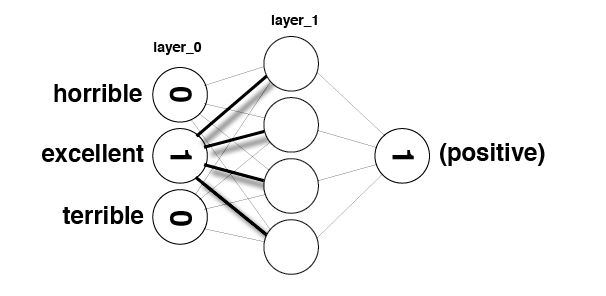

In [241]:
Image(filename='sentiment_network_sparse.png')

In [114]:
layer_0 = np.zeros(10)

In [115]:
layer_0

array([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])

In [116]:
layer_0[4] = 1
layer_0[9] = 1

In [117]:
layer_0

array([ 0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  1.])

In [134]:
weights_0_1 = np.random.randn(10,5)

In [135]:
weights_0_1

array([[-0.75439794,  1.25286816,  0.51292982, -0.29809284,  0.48851815],
       [-0.07557171,  1.13162939,  1.51981682,  2.18557541, -1.39649634],
       [-1.44411381, -0.50446586,  0.16003707,  0.87616892,  0.31563495],
       [-2.02220122, -0.30620401,  0.82797464,  0.23009474,  0.76201118],
       [-0.22232814, -0.20075807,  0.18656139,  0.41005165,  0.19829972],
       [ 0.11900865, -0.67066229,  0.37756379,  0.12182127,  1.12948391],
       [ 1.19891788,  0.18515642, -0.37528495, -0.63873041,  0.42349435],
       [ 0.07734007, -0.34385368,  0.04359686, -0.62000084,  0.69803203],
       [-0.44712856,  1.2245077 ,  0.40349164,  0.59357852, -1.09491185],
       [ 0.16938243,  0.74055645, -0.9537006 , -0.26621851,  0.03261455]])

In [119]:
layer_0.dot(weights_0_1)

array([-0.10503756,  0.44222989,  0.24392938, -0.55961832,  0.21389503])

In [125]:
indices = [4,9]

In [128]:
indices

[4, 9]

In [132]:
layer_1 = np.zeros(5)

In [133]:
for index in indices:
    layer_1 += (1 * weights_0_1[index])
    print("index",index)
    print("layer_1",layer_1)
    print(weights_0_1[index])

index 4
layer_1 [-0.69166075 -0.39675353 -0.6871727  -0.84520564 -0.67124613]
[-0.69166075 -0.39675353 -0.6871727  -0.84520564 -0.67124613]
index 9
layer_1 [-0.10503756  0.44222989  0.24392938 -0.55961832  0.21389503]
[ 0.58662319  0.83898341  0.93110208  0.28558733  0.88514116]


In [123]:
layer_1

array([-0.10503756,  0.44222989,  0.24392938, -0.55961832,  0.21389503])

In [ ]:
Image(filename='sentiment_network_sparse_2.png')

In [ ]:
layer_1 = np.zeros(5)

In [ ]:
for index in indices:
    layer_1 += (weights_0_1[index])

In [ ]:
layer_1

# Project 5: Making our Network More Efficient<a id='project_5'></a>
**TODO:** Make the `SentimentNetwork` class more efficient by eliminating unnecessary multiplications and additions that occur during forward and backward propagation. To do that, you can do the following:
* Copy the `SentimentNetwork` class from the previous project into the following cell.
* Remove the `update_input_layer` function - you will not need it in this version.
* Modify `init_network`:
>* You no longer need a separate input layer, so remove any mention of `self.layer_0`
>* You will be dealing with the old hidden layer more directly, so create `self.layer_1`, a two-dimensional matrix with shape 1 x hidden_nodes, with all values initialized to zero
* Modify `train`:
>* Change the name of the input parameter `training_reviews` to `training_reviews_raw`. This will help with the next step.
>* At the beginning of the function, you'll want to preprocess your reviews to convert them to a list of indices (from `word2index`) that are actually used in the review. This is equivalent to what you saw in the video when Andrew set specific indices to 1. Your code should create a local `list` variable named `training_reviews` that should contain a `list` for each review in `training_reviews_raw`. Those lists should contain the indices for words found in the review.
>* Remove call to `update_input_layer`
>* Use `self`'s  `layer_1` instead of a local `layer_1` object.
>* In the forward pass, replace the code that updates `layer_1` with new logic that only adds the weights for the indices used in the review.
>* When updating `weights_0_1`, only update the individual weights that were used in the forward pass.
* Modify `run`:
>* Remove call to `update_input_layer` 
>* Use `self`'s  `layer_1` instead of a local `layer_1` object.
>* Much like you did in `train`, you will need to pre-process the `review` so you can work with word indices, then update `layer_1` by adding weights for the indices used in the review.

In [ ]:
# TODO: -Copy the SentimentNetwork class from Project 4 lesson
#       -Modify it according to the above instructions 

In [273]:
import time
import sys
import numpy as np

# Encapsulate our neural network in a class
class SentimentNetwork:
    def __init__(self, reviews, labels, hidden_nodes = 10, learning_rate = 0.1):
        """Create a SentimenNetwork with the given settings
        Args:
            reviews(list) - List of reviews used for training
            labels(list) - List of POSITIVE/NEGATIVE labels associated with the given reviews
            hidden_nodes(int) - Number of nodes to create in the hidden layer
            learning_rate(float) - Learning rate to use while training
        
        """
        # Assign a seed to our random number generator to ensure we get
        # reproducable results during development 
        np.random.seed(1)

        # process the reviews and their associated labels so that everything
        # is ready for training
        self.pre_process_data(reviews, labels)
        
        # Build the network to have the number of hidden nodes and the learning rate that
        # were passed into this initializer. Make the same number of input nodes as
        # there are vocabulary words and create a single output node.
        self.init_network(len(self.review_vocab),hidden_nodes, 1, learning_rate)

    def pre_process_data(self, reviews, labels):
        
        review_vocab = set()
        for review in reviews:
            for word in review.split(" "):
                review_vocab.add(word)


        # TODO: populate review_vocab with all of the words in the given reviews
        #       Remember to split reviews into individual words 
        #       using "split(' ')" instead of "split()".
        #MC: DONE
        
        # Convert the vocabulary set to a list so we can access words via indices
        self.review_vocab = list(review_vocab)
        
        label_vocab = set()
        for label in labels:
            label_vocab.add(label)
            
            
        # TODO: populate label_vocab with all of the words in the given labels.
        #       There is no need to split the labels because each one is a single word.
        
        # Convert the label vocabulary set to a list so we can access labels via indices
        self.label_vocab = list(label_vocab)
        
        # Store the sizes of the review and label vocabularies.
        self.review_vocab_size = len(self.review_vocab)
        self.label_vocab_size = len(self.label_vocab)
        
        # Create a dictionary of words in the vocabulary mapped to index positions
        self.word2index = {}
        for i,word in enumerate(self.review_vocab):
            self.word2index[word] = i
        # TODO: populate self.word2index with indices for all the words in self.review_vocab
        #       like you saw earlier in the notebook
        
        # Create a dictionary of labels mapped to index positions
        self.label2index = {}
        for i,word in enumerate(self.label_vocab):
            self.label2index[word] = i
        # TODO: do the same thing you did for self.word2index and self.review_vocab, 
        #       but for self.label2index and self.label_vocab instead
         
        
    def init_network(self, input_nodes, hidden_nodes, output_nodes, learning_rate):
        # Store the number of nodes in input, hidden, and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Store the learning rate
        self.learning_rate = learning_rate

        # Initialize weights
        
        # TODO: initialize self.weights_0_1 as a matrix of zeros. These are the weights between
        #       the input layer and the hidden layer.
        self.weights_0_1 = np.zeros((self.input_nodes,self.hidden_nodes))
        
        # TODO: initialize self.weights_1_2 as a matrix of random values. 
        #       These are the weights between the hidden layer and the output layer.
        self.weights_1_2 = np.random.normal(0.0, self.output_nodes**-0.5,(self.hidden_nodes,self.output_nodes))
        
        # TODO: Create the input layer, a two-dimensional matrix with shape 
        #       1 x input_nodes, with all values initialized to zero
        #self.layer_0 = np.zeros((1,input_nodes))
        self.layer_1 = np.zeros((1,hidden_nodes))
    
    '''  
    def update_input_layer(self,review):
        # TODO: You can copy most of the code you wrote for update_input_layer 
        #       earlier in this notebook. 
        #
    
         
         
            
        # clear out previous state by resetting the layer to be all 0s
        #self.layer_0 *= 0
        # TODO: count how many times each word is used in the given review and store the results in layer_0
        for word in review.split(" "):
            if(word in self.word2index.keys()):
                self.layer_0[0][self.word2index[word]]=1
        #       However, MAKE SURE YOU CHANGE ALL VARIABLES TO REFERENCE
        #       THE VERSIONS STORED IN THIS OBJECT, NOT THE GLOBAL OBJECTS.
        #       For example, replace "layer_0 *= 0" with "self.layer_0 *= 0"
      ''' 
                
    def get_target_for_label(self,label):
        
        if label == "POSITIVE":
            return 1
        else:
            return 0
        # TODO: Copy the code you wrote for get_target_for_label 
        #       earlier in this notebook. 
        
        
    def sigmoid(self,x):
        return 1/(1+np.exp(-x))
        # TODO: Return the result of calculating the sigmoid activation function
        #       shown in the lectures
        
    
    def sigmoid_output_2_derivative(self,output):
        return output*(1- output)
        # TODO: Return the derivative of the sigmoid activation function, 
        #       where "output" is the original output from the sigmoid fucntion 
        

    def train(self, training_reviews_raw, training_labels):
        
        training_reviews = list()
        for review in training_reviews_raw:
            indices = set()
            for word in review.split(" "):
                if(word in self.word2index.keys()):
                    indices.add(self.word2index[word])
            training_reviews.append(list(indices))
            
        print(training_reviews)
       
        # make sure out we have a matching number of reviews and labels
        assert(len(training_reviews_raw) == len(training_labels))
        
        # Keep track of correct predictions to display accuracy during training 
        correct_so_far = 0
        
        # Remember when we started for printing time statistics
        start = time.time()

        # loop through all the given reviews and run a forward and backward pass,
        # updating weights for every item
        for i in range(len(training_reviews)):
            
            # TODO: Get the next review and its correct label
            review=training_reviews[i]
            label=training_labels[i]
            
            
            
            
            
            # TODO: Implement the forward pass through the network. 
            #       That means use the given review to update the input layer, 
            #       then calculate values for the hidden layer,
            #       and finally calculate the output layer.
            
            
            #       Do not use an activation function for the hidden layer,
            #       but use the sigmoid activation function for the output layer.
            #self.update_input_layer(review)
            target=self.get_target_for_label(label)
            
            #hidden_outputs=self.layer_0.dot(self.weights_0_1)
            self.layer_1 *= 0
            for index in review:
                self.layer_1 +=self.weights_0_1[index]
            
            hidden_outputs=self.layer_1
        
            final_outputs=self.sigmoid(hidden_outputs.dot(self.weights_1_2))
       
        
            
            
            # TODO: Implement the back propagation pass here. 
            #       That means calculate the error for the forward pass's prediction
            #       and update the weights in the network according to their
            #       contributions toward the error, as calculated via the
            #       gradient descent and back propagation algorithms you 
            #       learned in class.
            
            #output_layer_error
            error=final_outputs-target
            output_error_term=error*self.sigmoid_output_2_derivative(final_outputs)
            
            #hidden_layer_error
            hidden_error=np.dot(output_error_term,self.weights_1_2.T)
            hidden_error_term=hidden_error
            
            #weights_update
            self.weights_1_2-=hidden_outputs.T.dot(output_error_term)*self.learning_rate
            for index in review:
                self.weights_0_1[index]-=hidden_error_term[0]*self.learning_rate
            
            
                
            
            # TODO: Keep track of correct predictions. To determine if the prediction was
            #       correct, check that the absolute value of the output error 
            #       is less than 0.5. If so, add one to the correct_so_far count.
            
            
            if np.abs(error) < 0.5:
                correct_so_far += 1
            '''if(final_outputs >= 0.5 and label == 'POSITIVE'):
                correct_so_far += 1
            elif(final_outputs < 0.5 and label == 'NEGATIVE'):
                correct_so_far += 1
            '''
            
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the training process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(training_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct_so_far) + " #Trained:" + str(i+1) \
                             + " Training Accuracy:" + str(correct_so_far * 100 / float(i+1))[:4] + "%")
            if(i % 2500 == 0):
                print("")
    
    def test(self, testing_reviews, testing_labels):
        """
        Attempts to predict the labels for the given testing_reviews,
        and uses the test_labels to calculate the accuracy of those predictions.
        """
        
        # keep track of how many correct predictions we make
        correct = 0

        # we'll time how many predictions per second we make
        start = time.time()

        # Loop through each of the given reviews and call run to predict
        # its label. 
        for i in range(len(testing_reviews)):
            pred = self.run(testing_reviews[i])
            if(pred == testing_labels[i]):
                correct += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the prediction process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(testing_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct) + " #Tested:" + str(i+1) \
                             + " Testing Accuracy:" + str(correct * 100 / float(i+1))[:4] + "%")
    
    def run(self, review):
        """
        Returns a POSITIVE or NEGATIVE prediction for the given review.
        """
        # TODO: Run a forward pass through the network, like you did in the
        #       "train" function. That means use the given review to 
        #       update the input layer, then calculate values for the hidden layer,
        #       and finally calculate the output layer.
        
        #self.update_input_layer(review.lower())
        self.layer_1*= 0
        training_reviews_1=[]
        indeces_1=set()
        

        for word in review.lower().split(" "):

            if(word in self.word2index.keys()):
                indeces_1.add(self.word2index[word])
        
        for index in indeces_1:
            self.layer_1 += (self.weights_0_1[index])
        hidden_outputs=self.layer_1
            
        #hidden_outputs=self.layer_1.dot(self.weights_0_1)
        #hidden_outputs=hidden_inputs
        final_outputs=self.sigmoid(hidden_outputs.dot(self.weights_1_2))
        #
        #       Note: The review passed into this function for prediction 
        #             might come from anywhere, so you should convert it 
        #             to lower case prior to using it.
        
        # TODO: The output layer should now contain a prediction. 
        #       Return `POSITIVE` for predictions greater-than-or-equal-to `0.5`, 
        #       and `NEGATIVE` otherwise.
        if(final_outputs[0] >= 0.5):
            return "POSITIVE"
        else:
            return "NEGATIVE"
    
        
        


Run the following cell to recreate the network and train it once again.

In [275]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.1)
mlp.train(reviews[:-1000],labels[:-1000])

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


Progress:1.37% Speed(reviews/sec):583.9 #Correct:200 #Trained:330 Training Accuracy:60.6%

Progress:2.96% Speed(reviews/sec):713.5 #Correct:432 #Trained:713 Training Accuracy:60.5%

Progress:4.84% Speed(reviews/sec):806.5 #Correct:781 #Trained:1164 Training Accuracy:67.0%

Progress:5.53% Speed(reviews/sec):805.9 #Correct:892 #Trained:1330 Training Accuracy:67.0%

Progress:6.85% Speed(reviews/sec):858.5 #Correct:1125 #Trained:1645 Training Accuracy:68.3%

Progress:7.96% Speed(reviews/sec):894.3 #Correct:1338 #Trained:1913 Training Accuracy:69.9%

Progress:9.05% Speed(reviews/sec):920.6 #Correct:1555 #Trained:2174 Training Accuracy:71.5%

Progress:10.0% Speed(reviews/sec):927.2 #Correct:1734 #Trained:2401 Training Accuracy:72.2%

Progress:10.4% Speed(reviews/sec):929.1 #Correct:1810 #Trained:2501 Training Accuracy:72.3%


Progress:11.8% Speed(reviews/sec):945.4 #Correct:2089 #Trained:2836 Training Accuracy:73.6%

Progress:12.8% Speed(reviews/sec):953.3 #Correct:2290 #Trained:3093 Training Accuracy:74.0%

Progress:14.5% Speed(reviews/sec):966.6 #Correct:2594 #Trained:3496 Training Accuracy:74.1%

Progress:16.0% Speed(reviews/sec):969.8 #Correct:2886 #Trained:3861 Training Accuracy:74.7%

Progress:17.1% Speed(reviews/sec):976.0 #Correct:3088 #Trained:4117 Training Accuracy:75.0%

Progress:18.3% Speed(reviews/sec):982.8 #Correct:3322 #Trained:4414 Training Accuracy:75.2%

Progress:18.8% Speed(reviews/sec):955.4 #Correct:3405 #Trained:4514 Training Accuracy:75.4%

Progress:19.4% Speed(reviews/sec):949.7 #Correct:3529 #Trained:4668 Training Accuracy:75.5%

Progress:20.3% Speed(reviews/sec):945.5 #Correct:3703 #Trained:4880 Training Accuracy:75.8%

Progress:20.8% Speed(reviews/sec):944.0 #Correct:3798 #Trained:5001 Training Accuracy:75.9%


Progress:22.6% Speed(reviews/sec):941.1 #Correct:4163 #Trained:5441 Training Accuracy:76.5%

Progress:23.4% Speed(reviews/sec):939.5 #Correct:4313 #Trained:5627 Training Accuracy:76.6%

Progress:24.2% Speed(reviews/sec):936.5 #Correct:4482 #Trained:5830 Training Accuracy:76.8%

Progress:24.9% Speed(reviews/sec):931.5 #Correct:4608 #Trained:5988 Training Accuracy:76.9%

Progress:25.5% Speed(reviews/sec):925.7 #Correct:4730 #Trained:6140 Training Accuracy:77.0%

Progress:26.3% Speed(reviews/sec):923.0 #Correct:4896 #Trained:6326 Training Accuracy:77.3%

Progress:27.2% Speed(reviews/sec):927.9 #Correct:5070 #Trained:6542 Training Accuracy:77.4%

Progress:28.1% Speed(reviews/sec):924.7 #Correct:5241 #Trained:6750 Training Accuracy:77.6%

Progress:28.8% Speed(reviews/sec):919.8 #Correct:5389 #Trained:6920 Training Accuracy:77.8%

Progress:29.4% Speed(reviews/sec):916.1 #Correct:5526 #Trained:7080 Training Accuracy:78.0%

Progress:30.2% Speed(reviews/sec):914.0 #Correct:5680 #Trained:7258 Training Accuracy:78.2%

Progress:31.0% Speed(reviews/sec):914.3 #Correct:5842 #Trained:7453 Training Accuracy:78.3%

Progress:31.2% Speed(reviews/sec):913.3 #Correct:5878 #Trained:7501 Training Accuracy:78.3%


Progress:32.4% Speed(reviews/sec):911.8 #Correct:6116 #Trained:7781 Training Accuracy:78.6%

Progress:33.3% Speed(reviews/sec):909.6 #Correct:6314 #Trained:8011 Training Accuracy:78.8%

Progress:34.1% Speed(reviews/sec):911.4 #Correct:6481 #Trained:8207 Training Accuracy:78.9%

Progress:35.5% Speed(reviews/sec):916.9 #Correct:6760 #Trained:8532 Training Accuracy:79.2%

Progress:36.5% Speed(reviews/sec):921.1 #Correct:6954 #Trained:8765 Training Accuracy:79.3%

Progress:37.3% Speed(reviews/sec):920.2 #Correct:7124 #Trained:8957 Training Accuracy:79.5%

Progress:38.1% Speed(reviews/sec):923.0 #Correct:7292 #Trained:9145 Training Accuracy:79.7%

Progress:39.2% Speed(reviews/sec):928.7 #Correct:7527 #Trained:9416 Training Accuracy:79.9%

Progress:40.3% Speed(reviews/sec):933.5 #Correct:7775 #Trained:9696 Training Accuracy:80.1%

Progress:41.6% Speed(reviews/sec):939.6 #Correct:8038 #Trained:10001 Training Accuracy:80.3%


Progress:43.9% Speed(reviews/sec):947.1 #Correct:8496 #Trained:10540 Training Accuracy:80.6%

Progress:45.2% Speed(reviews/sec):950.5 #Correct:8760 #Trained:10864 Training Accuracy:80.6%

Progress:46.2% Speed(reviews/sec):952.7 #Correct:8966 #Trained:11104 Training Accuracy:80.7%

Progress:47.1% Speed(reviews/sec):954.4 #Correct:9140 #Trained:11316 Training Accuracy:80.7%

Progress:48.1% Speed(reviews/sec):958.3 #Correct:9349 #Trained:11559 Training Accuracy:80.8%

Progress:49.3% Speed(reviews/sec):960.1 #Correct:9598 #Trained:11849 Training Accuracy:81.0%

Progress:50.4% Speed(reviews/sec):962.3 #Correct:9830 #Trained:12108 Training Accuracy:81.1%

Progress:51.6% Speed(reviews/sec):966.0 #Correct:10065 #Trained:12389 Training Accuracy:81.2%

Progress:52.0% Speed(reviews/sec):966.9 #Correct:10166 #Trained:12501 Training Accuracy:81.3%


Progress:53.8% Speed(reviews/sec):970.7 #Correct:10534 #Trained:12926 Training Accuracy:81.4%

Progress:55.0% Speed(reviews/sec):973.7 #Correct:10787 #Trained:13217 Training Accuracy:81.6%

Progress:56.6% Speed(reviews/sec):976.5 #Correct:11101 #Trained:13590 Training Accuracy:81.6%

Progress:57.5% Speed(reviews/sec):977.6 #Correct:11279 #Trained:13802 Training Accuracy:81.7%

Progress:58.6% Speed(reviews/sec):980.8 #Correct:11517 #Trained:14069 Training Accuracy:81.8%

Progress:59.9% Speed(reviews/sec):983.9 #Correct:11765 #Trained:14377 Training Accuracy:81.8%

Progress:60.8% Speed(reviews/sec):986.3 #Correct:11956 #Trained:14614 Training Accuracy:81.8%

Progress:61.6% Speed(reviews/sec):985.5 #Correct:12118 #Trained:14805 Training Accuracy:81.8%

Progress:62.5% Speed(reviews/sec):985.7 #Correct:12284 #Trained:15001 Training Accuracy:81.8%


Progress:63.4% Speed(reviews/sec):985.3 #Correct:12466 #Trained:15220 Training Accuracy:81.9%

Progress:64.2% Speed(reviews/sec):986.1 #Correct:12642 #Trained:15428 Training Accuracy:81.9%

Progress:65.2% Speed(reviews/sec):987.6 #Correct:12826 #Trained:15649 Training Accuracy:81.9%

Progress:66.3% Speed(reviews/sec):989.7 #Correct:13061 #Trained:15919 Training Accuracy:82.0%

Progress:67.4% Speed(reviews/sec):990.6 #Correct:13277 #Trained:16183 Training Accuracy:82.0%

Progress:68.2% Speed(reviews/sec):992.5 #Correct:13443 #Trained:16381 Training Accuracy:82.0%

Progress:69.6% Speed(reviews/sec):992.7 #Correct:13729 #Trained:16718 Training Accuracy:82.1%

Progress:70.9% Speed(reviews/sec):996.3 #Correct:13997 #Trained:17034 Training Accuracy:82.1%

Progress:72.9% Speed(reviews/sec):999.7 #Correct:14404 #Trained:17501 Training Accuracy:82.3%


Progress:75.1% Speed(reviews/sec):1001. #Correct:14870 #Trained:18048 Training Accuracy:82.3%

Progress:77.6% Speed(reviews/sec):1003. #Correct:15389 #Trained:18627 Training Accuracy:82.6%

Progress:79.5% Speed(reviews/sec):1004. #Correct:15789 #Trained:19081 Training Accuracy:82.7%

Progress:81.6% Speed(reviews/sec):1006. #Correct:16235 #Trained:19585 Training Accuracy:82.8%

Progress:83.3% Speed(reviews/sec):1008. #Correct:16587 #Trained:20001 Training Accuracy:82.9%


Progress:87.8% Speed(reviews/sec):1011. #Correct:17536 #Trained:21083 Training Accuracy:83.1%

Progress:92.1% Speed(reviews/sec):1016. #Correct:18442 #Trained:22118 Training Accuracy:83.3%

Progress:93.7% Speed(reviews/sec):1018. #Correct:18775 #Trained:22501 Training Accuracy:83.4%
Progress:99.9% Speed(reviews/sec):1023. #Correct:20100 #Trained:24000 Training Accuracy:83.7%

That should have trained much better than the earlier attempts. Run the following cell to test your model with 1000 predictions.

In [276]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:25.7% Speed(reviews/sec):1284. #Correct:229 #Tested:258 Testing Accuracy:88.7%

Progress:47.1% Speed(reviews/sec):1408. #Correct:415 #Tested:472 Testing Accuracy:87.9%

Progress:99.9% Speed(reviews/sec):1363. #Correct:851 #Tested:1000 Testing Accuracy:85.1%

# End of Project 5. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.
# Further Noise Reduction<a id='lesson_6'></a>

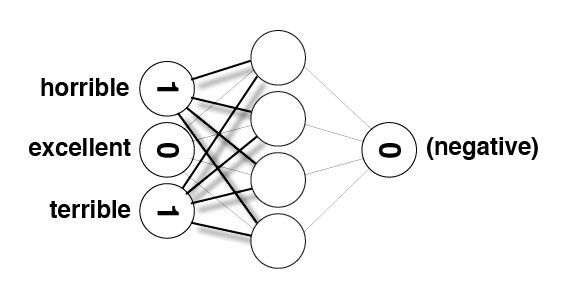

In [111]:
Image(filename='sentiment_network_sparse_2.png')

In [289]:
# words most frequently seen in a review with a "POSITIVE" label
pos_neg_ratios.most_common()

[('edie', 109.0),
 ('paulie', 59.0),
 ('felix', 23.4),
 ('polanski', 16.833333333333332),
 ('matthau', 16.555555555555557),
 ('victoria', 14.6),
 ('mildred', 13.5),
 ('gandhi', 12.666666666666666),
 ('flawless', 11.6),
 ('superbly', 9.583333333333334),
 ('perfection', 8.666666666666666),
 ('astaire', 8.5),
 ('captures', 7.68),
 ('wonderfully', 7.552631578947368),
 ('powell', 7.230769230769231),
 ('brosnan', 7.0625),
 ('lily', 6.823529411764706),
 ('bakshi', 6.705882352941177),
 ('lincoln', 6.695652173913044),
 ('refreshing', 6.392857142857143),
 ('breathtaking', 6.3478260869565215),
 ('bourne', 6.346153846153846),
 ('delightful', 6.051282051282051),
 ('flynn', 6.0476190476190474),
 ('andrews', 5.909090909090909),
 ('beautifully', 5.828125),
 ('elvira', 5.695652173913044),
 ('underrated', 5.583333333333333),
 ('gripping', 5.565217391304348),
 ('superb', 5.524271844660194),
 ('delight', 5.32),
 ('welles', 5.3),
 ('sinatra', 5.15),
 ('touching', 5.140845070422535),
 ('timeless', 5.1),
 ('

In [283]:
# words most frequently seen in a review with a "NEGATIVE" label
list(reversed(pos_neg_ratios.most_common()))[0:30]

[('worst', 0.10157194679564692),
 ('awful', 0.10783055198973042),
 ('horrible', 0.14804202483285578),
 ('crap', 0.16071428571428573),
 ('worse', 0.176),
 ('terrible', 0.17744252873563218),
 ('mess', 0.18450184501845018),
 ('stupid', 0.19104268719384185),
 ('dull', 0.20501474926253688),
 ('avoid', 0.20684292379471228),
 ('ridiculous', 0.22123893805309736),
 ('boring', 0.22515212981744423),
 ('dumb', 0.24081632653061225),
 ('annoying', 0.2550251256281407),
 ('bad', 0.2576330721426641),
 ('unless', 0.25884543761638734),
 ('fails', 0.25933609958506226),
 ('zombies', 0.2696078431372549),
 ('supposed', 0.2780117944397641),
 ('poor', 0.2807017543859649),
 ('fake', 0.28378378378378377),
 ('joke', 0.28865979381443296),
 ('cheap', 0.2904624277456647),
 ('trash', 0.32894736842105265),
 ('oh', 0.33640552995391704),
 ('failed', 0.34444444444444444),
 ('bored', 0.3477157360406091),
 ('painful', 0.35275080906148865),
 ('nowhere', 0.3577981651376147),
 ('predictable', 0.35930047694753575)]

In [284]:
from bokeh.models import ColumnDataSource, LabelSet
from bokeh.plotting import figure, show, output_file
from bokeh.io import output_notebook
output_notebook()

Loading BokehJS ...

In [296]:
hist, edges = np.histogram(list(map(lambda x:x[1],pos_neg_ratios.most_common())), density=True, bins=1000, normed=True)

p = figure(tools="pan,wheel_zoom,reset,save",
           toolbar_location="above",
           title="Word Positive/Negative Affinity Distribution")
p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:100], line_color="#555555")
show(p)

/Users/michalczapski/anaconda/envs/Sentiment/lib/python3.6/site-packages/bokeh/models/sources.py:91: BokehUserWarning: ColumnDataSource's columns must be of the same length. Current lengths: ('left', 1000), ('right', 99)
  "Current lengths: %s" % ", ".join(sorted(str((k, len(v))) for k, v in data.items())), BokehUserWarning))
/Users/michalczapski/anaconda/envs/Sentiment/lib/python3.6/site-packages/bokeh/models/sources.py:91: BokehUserWarning: ColumnDataSource's columns must be of the same length. Current lengths: ('left', 1000), ('right', 99), ('top', 1000)
  "Current lengths: %s" % ", ".join(sorted(str((k, len(v))) for k, v in data.items())), BokehUserWarning))


In [298]:
frequency_frequency = Counter()

for word, cnt in total_counts.most_common():
    frequency_frequency[cnt] += 1
   

In [299]:
frequency_frequency

Counter({1111930: 1,
         336713: 1,
         327192: 1,
         164107: 1,
         163009: 1,
         145864: 1,
         135720: 1,
         107328: 1,
         101872: 1,
         96352: 1,
         93968: 1,
         87623: 1,
         76000: 1,
         73245: 1,
         65361: 1,
         48208: 1,
         46933: 1,
         44343: 1,
         44125: 1,
         44039: 1,
         42603: 1,
         40155: 1,
         34230: 1,
         34200: 1,
         34081: 1,
         30626: 1,
         30138: 1,
         29430: 1,
         29374: 1,
         27731: 1,
         26957: 1,
         26789: 1,
         23978: 1,
         23513: 1,
         22906: 1,
         22546: 1,
         21560: 1,
         21433: 1,
         20617: 1,
         20498: 1,
         20276: 1,
         18832: 1,
         18421: 1,
         18004: 1,
         17771: 1,
         17374: 1,
         17113: 1,
         16803: 1,
         16790: 1,
         16159: 1,
         15747: 1,
         15143: 1,
  

In [288]:
hist, edges = np.histogram(list(map(lambda x:x[1],frequency_frequency.most_common())), density=True, bins=100, normed=True)

p = figure(tools="pan,wheel_zoom,reset,save",
           toolbar_location="above",
           title="The frequency distribution of the words in our corpus")
p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:], line_color="#555555")
show(p)

# Project 6: Reducing Noise by Strategically Reducing the Vocabulary<a id='project_6'></a>

**TODO:** Improve `SentimentNetwork`'s performance by reducing more noise in the vocabulary. Specifically, do the following:
* Copy the `SentimentNetwork` class from the previous project into the following cell.
* Modify `pre_process_data`:
>* Add two additional parameters: `min_count` and `polarity_cutoff`
>* Calculate the positive-to-negative ratios of words used in the reviews. (You can use code you've written elsewhere in the notebook, but we are moving it into the class like we did with other helper code earlier.)
>* Andrew's solution only calculates a postive-to-negative ratio for words that occur at least 50 times. This keeps the network from attributing too much sentiment to rarer words. You can choose to add this to your solution if you would like.  
>* Change so words are only added to the vocabulary if they occur in the vocabulary more than `min_count` times.
>* Change so words are only added to the vocabulary if the absolute value of their postive-to-negative ratio is at least `polarity_cutoff`
* Modify `__init__`:
>* Add the same two parameters (`min_count` and `polarity_cutoff`) and use them when you call `pre_process_data`

In [300]:
# TODO: -Copy the SentimentNetwork class from Project 5 lesson
#       -Modify it according to the above instructions 

In [338]:
import time
import sys
import numpy as np

# Encapsulate our neural network in a class
class SentimentNetwork:
    def __init__(self, reviews, labels, min_count, polarity_cutoff, hidden_nodes = 10, learning_rate = 0.1):
        """Create a SentimenNetwork with the given settings
        Args:
            reviews(list) - List of reviews used for training
            labels(list) - List of POSITIVE/NEGATIVE labels associated with the given reviews
            hidden_nodes(int) - Number of nodes to create in the hidden layer
            learning_rate(float) - Learning rate to use while training
        
        """
        # Assign a seed to our random number generator to ensure we get
        # reproducable results during development 
        np.random.seed(1)

        # process the reviews and their associated labels so that everything
        # is ready for training
        self.pre_process_data(reviews, labels, min_count, polarity_cutoff)
        
        # Build the network to have the number of hidden nodes and the learning rate that
        # were passed into this initializer. Make the same number of input nodes as
        # there are vocabulary words and create a single output node.
        self.init_network(len(self.review_vocab),hidden_nodes, 1, learning_rate)

    def pre_process_data(self, reviews, labels, min_count, polarity_cutoff):
        # Create Counter object to store positive/negative ratios

        # Create three Counter objects to store positive, negative and total counts
        positive_counts = Counter()
        negative_counts = Counter()
        total_counts = Counter()
        pos_neg_ratios = Counter()
        
        for i in range(len(reviews)):
            if labels[i]=='POSITIVE':
                for word in reviews[i].split(" "):
                    positive_counts[word]+=1
                    total_counts[word]+=1
    
            elif labels[i]=="NEGATIVE":
                for word in reviews[i].split(" "):
                    negative_counts[word]+=1
                    total_counts[word]+=1

        # TODO: Calculate the ratios of positive and negative uses of the most common words
        #       Consider words to be "common" if they've been used at least 100 times
        ###print(len(positive_counts))
        for word in total_counts.most_common():
            if total_counts[word]>=50:
                pos_neg_ratios[word]=np.log(positive_counts[word] / float(negative_counts[word]+1))
            else:
                pass
            
        review_vocab = set()
        for review in reviews:
            for word in review.split(" "):
                if (total_counts[word]>min_count):
                    if word in pos_neg_ratios.keys():
                        if np.abs(pos_neg_ratios[word])>=polarity_cutoff:
                            review_vocab.add(word)
                    else:
                        review_vocab.add(word)
                        


        # TODO: populate review_vocab with all of the words in the given reviews
        #       Remember to split reviews into individual words 
        #       using "split(' ')" instead of "split()".
        #MC: DONE
        
        # Convert the vocabulary set to a list so we can access words via indices
        self.review_vocab = list(review_vocab)
        
        label_vocab = set()
        for label in labels:
            label_vocab.add(label)
            
            
        # TODO: populate label_vocab with all of the words in the given labels.
        #       There is no need to split the labels because each one is a single word.
        
        # Convert the label vocabulary set to a list so we can access labels via indices
        self.label_vocab = list(label_vocab)
        
        # Store the sizes of the review and label vocabularies.
        self.review_vocab_size = len(self.review_vocab)
        self.label_vocab_size = len(self.label_vocab)
        
        # Create a dictionary of words in the vocabulary mapped to index positions
        self.word2index = {}
        for i,word in enumerate(self.review_vocab):
            self.word2index[word] = i
        # TODO: populate self.word2index with indices for all the words in self.review_vocab
        #       like you saw earlier in the notebook
        
        # Create a dictionary of labels mapped to index positions
        self.label2index = {}
        for i,word in enumerate(self.label_vocab):
            self.label2index[word] = i
        # TODO: do the same thing you did for self.word2index and self.review_vocab, 
        #       but for self.label2index and self.label_vocab instead
         
        
        
    def init_network(self, input_nodes, hidden_nodes, output_nodes, learning_rate):
        # Store the number of nodes in input, hidden, and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Store the learning rate
        self.learning_rate = learning_rate

        # Initialize weights
        
        # TODO: initialize self.weights_0_1 as a matrix of zeros. These are the weights between
        #       the input layer and the hidden layer.
        self.weights_0_1 = np.zeros((self.input_nodes,self.hidden_nodes))
        
        # TODO: initialize self.weights_1_2 as a matrix of random values. 
        #       These are the weights between the hidden layer and the output layer.
        self.weights_1_2 = np.random.normal(0.0, self.output_nodes**-0.5,(self.hidden_nodes,self.output_nodes))
        
        # TODO: Create the input layer, a two-dimensional matrix with shape 
        #       1 x input_nodes, with all values initialized to zero
        #self.layer_0 = np.zeros((1,input_nodes))
        self.layer_1 = np.zeros((1,hidden_nodes))
    
    '''  
    def update_input_layer(self,review):
        # TODO: You can copy most of the code you wrote for update_input_layer 
        #       earlier in this notebook. 
        #
    
         
         
            
        # clear out previous state by resetting the layer to be all 0s
        #self.layer_0 *= 0
        # TODO: count how many times each word is used in the given review and store the results in layer_0
        for word in review.split(" "):
            if(word in self.word2index.keys()):
                self.layer_0[0][self.word2index[word]]=1
        #       However, MAKE SURE YOU CHANGE ALL VARIABLES TO REFERENCE
        #       THE VERSIONS STORED IN THIS OBJECT, NOT THE GLOBAL OBJECTS.
        #       For example, replace "layer_0 *= 0" with "self.layer_0 *= 0"
      ''' 
                
    def get_target_for_label(self,label):
        
        if label == "POSITIVE":
            return 1
        else:
            return 0
        # TODO: Copy the code you wrote for get_target_for_label 
        #       earlier in this notebook. 
        
        
    def sigmoid(self,x):
        return 1/(1+np.exp(-x))
        # TODO: Return the result of calculating the sigmoid activation function
        #       shown in the lectures
        
    
    def sigmoid_output_2_derivative(self,output):
        return output*(1- output)
        # TODO: Return the derivative of the sigmoid activation function, 
        #       where "output" is the original output from the sigmoid fucntion 
        

    def train(self, training_reviews_raw, training_labels):
        
        training_reviews = list()
        for review in training_reviews_raw:
            indices = set()
            for word in review.split(" "):
                if(word in self.word2index.keys()):
                    indices.add(self.word2index[word])
            training_reviews.append(list(indices))
            
        print(training_reviews)
       
        # make sure out we have a matching number of reviews and labels
        assert(len(training_reviews_raw) == len(training_labels))
        
        # Keep track of correct predictions to display accuracy during training 
        correct_so_far = 0
        
        # Remember when we started for printing time statistics
        start = time.time()

        # loop through all the given reviews and run a forward and backward pass,
        # updating weights for every item
        for i in range(len(training_reviews)):
            
            # TODO: Get the next review and its correct label
            review=training_reviews[i]
            label=training_labels[i]
            
            
            
            
            
            # TODO: Implement the forward pass through the network. 
            #       That means use the given review to update the input layer, 
            #       then calculate values for the hidden layer,
            #       and finally calculate the output layer.
            
            
            #       Do not use an activation function for the hidden layer,
            #       but use the sigmoid activation function for the output layer.
            #self.update_input_layer(review)
            target=self.get_target_for_label(label)
            
            #hidden_outputs=self.layer_0.dot(self.weights_0_1)
            self.layer_1 *= 0
            for index in review:
                self.layer_1 +=self.weights_0_1[index]
            
            hidden_outputs=self.layer_1
        
            final_outputs=self.sigmoid(hidden_outputs.dot(self.weights_1_2))
       
        
            
            
            # TODO: Implement the back propagation pass here. 
            #       That means calculate the error for the forward pass's prediction
            #       and update the weights in the network according to their
            #       contributions toward the error, as calculated via the
            #       gradient descent and back propagation algorithms you 
            #       learned in class.
            
            #output_layer_error
            error=final_outputs-target
            output_error_term=error*self.sigmoid_output_2_derivative(final_outputs)
            
            #hidden_layer_error
            hidden_error=np.dot(output_error_term,self.weights_1_2.T)
            hidden_error_term=hidden_error
            
            #weights_update
            self.weights_1_2-=hidden_outputs.T.dot(output_error_term)*self.learning_rate
            for index in review:
                self.weights_0_1[index]-=hidden_error_term[0]*self.learning_rate
            
            
                
            
            # TODO: Keep track of correct predictions. To determine if the prediction was
            #       correct, check that the absolute value of the output error 
            #       is less than 0.5. If so, add one to the correct_so_far count.
            
            
            if np.abs(error) < 0.5:
                correct_so_far += 1
            '''if(final_outputs >= 0.5 and label == 'POSITIVE'):
                correct_so_far += 1
            elif(final_outputs < 0.5 and label == 'NEGATIVE'):
                correct_so_far += 1
            '''
            
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the training process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(training_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct_so_far) + " #Trained:" + str(i+1) \
                             + " Training Accuracy:" + str(correct_so_far * 100 / float(i+1))[:4] + "%")
            if(i % 2500 == 0):
                print("")
    
    def test(self, testing_reviews, testing_labels):
        """
        Attempts to predict the labels for the given testing_reviews,
        and uses the test_labels to calculate the accuracy of those predictions.
        """
        
        # keep track of how many correct predictions we make
        correct = 0

        # we'll time how many predictions per second we make
        start = time.time()

        # Loop through each of the given reviews and call run to predict
        # its label. 
        for i in range(len(testing_reviews)):
            pred = self.run(testing_reviews[i])
            if(pred == testing_labels[i]):
                correct += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the prediction process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(testing_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct) + " #Tested:" + str(i+1) \
                             + " Testing Accuracy:" + str(correct * 100 / float(i+1))[:4] + "%")
    
    def run(self, review):
        """
        Returns a POSITIVE or NEGATIVE prediction for the given review.
        """
        # TODO: Run a forward pass through the network, like you did in the
        #       "train" function. That means use the given review to 
        #       update the input layer, then calculate values for the hidden layer,
        #       and finally calculate the output layer.
        
        #self.update_input_layer(review.lower())
        self.layer_1*= 0
        training_reviews_1=[]
        indeces_1=set()
        

        for word in review.lower().split(" "):

            if(word in self.word2index.keys()):
                indeces_1.add(self.word2index[word])
        
        for index in indeces_1:
            self.layer_1 += (self.weights_0_1[index])
        hidden_outputs=self.layer_1
            
        #hidden_outputs=self.layer_1.dot(self.weights_0_1)
        #hidden_outputs=hidden_inputs
        final_outputs=self.sigmoid(hidden_outputs.dot(self.weights_1_2))
        #
        #       Note: The review passed into this function for prediction 
        #             might come from anywhere, so you should convert it 
        #             to lower case prior to using it.
        
        # TODO: The output layer should now contain a prediction. 
        #       Return `POSITIVE` for predictions greater-than-or-equal-to `0.5`, 
        #       and `NEGATIVE` otherwise.
        if(final_outputs[0] >= 0.5):
            return "POSITIVE"
        else:
            return "NEGATIVE"
    
        
        


Run the following cell to train your network with a small polarity cutoff.

In [328]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000],min_count=20,polarity_cutoff=0.05,learning_rate=0.01)
mlp.train(reviews[:-1000],labels[:-1000])

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


Progress:1.67% Speed(reviews/sec):458.9 #Correct:291 #Trained:403 Training Accuracy:72.2%

Progress:2.29% Speed(reviews/sec):505.7 #Correct:393 #Trained:551 Training Accuracy:71.3%

Progress:2.96% Speed(reviews/sec):564.1 #Correct:514 #Trained:713 Training Accuracy:72.0%

Progress:3.56% Speed(reviews/sec):576.3 #Correct:626 #Trained:857 Training Accuracy:73.0%

Progress:4.86% Speed(reviews/sec):632.5 #Correct:884 #Trained:1168 Training Accuracy:75.6%

Progress:5.42% Speed(reviews/sec):628.4 #Correct:988 #Trained:1304 Training Accuracy:75.7%

Progress:6.25% Speed(reviews/sec):657.9 #Correct:1136 #Trained:1503 Training Accuracy:75.5%

Progress:6.67% Speed(reviews/sec):668.2 #Correct:1221 #Trained:1602 Training Accuracy:76.2%

Progress:8.38% Speed(reviews/sec):726.9 #Correct:1555 #Trained:2014 Training Accuracy:77.2%

Progress:9.32% Speed(reviews/sec):741.1 #Correct:1751 #Trained:2239 Training Accuracy:78.2%

Progress:10.1% Speed(reviews/sec):754.2 #Correct:1904 #Trained:2444 Training Accuracy:77.9%

Progress:10.4% Speed(reviews/sec):756.4 #Correct:1954 #Trained:2501 Training Accuracy:78.1%


Progress:11.8% Speed(reviews/sec):770.7 #Correct:2246 #Trained:2835 Training Accuracy:79.2%

Progress:12.7% Speed(reviews/sec):777.2 #Correct:2440 #Trained:3070 Training Accuracy:79.4%

Progress:13.2% Speed(reviews/sec):776.9 #Correct:2542 #Trained:3190 Training Accuracy:79.6%

Progress:14.4% Speed(reviews/sec):790.0 #Correct:2771 #Trained:3478 Training Accuracy:79.6%

Progress:15.3% Speed(reviews/sec):788.9 #Correct:2940 #Trained:3695 Training Accuracy:79.5%

Progress:16.2% Speed(reviews/sec):793.9 #Correct:3100 #Trained:3889 Training Accuracy:79.7%

Progress:17.0% Speed(reviews/sec):802.9 #Correct:3275 #Trained:4099 Training Accuracy:79.8%

Progress:18.0% Speed(reviews/sec):812.1 #Correct:3463 #Trained:4334 Training Accuracy:79.9%

Progress:19.0% Speed(reviews/sec):814.8 #Correct:3647 #Trained:4566 Training Accuracy:79.8%

Progress:19.4% Speed(reviews/sec):807.0 #Correct:3730 #Trained:4671 Training Accuracy:79.8%

Progress:20.3% Speed(reviews/sec):809.4 #Correct:3915 #Trained:4892 Training Accuracy:80.0%

Progress:20.8% Speed(reviews/sec):811.3 #Correct:3996 #Trained:5001 Training Accuracy:79.9%


Progress:22.0% Speed(reviews/sec):819.8 #Correct:4253 #Trained:5299 Training Accuracy:80.2%

Progress:22.8% Speed(reviews/sec):823.0 #Correct:4396 #Trained:5476 Training Accuracy:80.2%

Progress:24.3% Speed(reviews/sec):832.3 #Correct:4710 #Trained:5849 Training Accuracy:80.5%

Progress:25.1% Speed(reviews/sec):832.6 #Correct:4854 #Trained:6028 Training Accuracy:80.5%

Progress:26.0% Speed(reviews/sec):835.0 #Correct:5037 #Trained:6245 Training Accuracy:80.6%

Progress:26.9% Speed(reviews/sec):839.0 #Correct:5235 #Trained:6476 Training Accuracy:80.8%

Progress:27.8% Speed(reviews/sec):843.6 #Correct:5414 #Trained:6687 Training Accuracy:80.9%

Progress:28.6% Speed(reviews/sec):846.0 #Correct:5591 #Trained:6888 Training Accuracy:81.1%

Progress:29.5% Speed(reviews/sec):849.1 #Correct:5774 #Trained:7102 Training Accuracy:81.3%

Progress:30.8% Speed(reviews/sec):854.7 #Correct:6027 #Trained:7397 Training Accuracy:81.4%

Progress:31.2% Speed(reviews/sec):856.1 #Correct:6114 #Trained:7501 Training Accuracy:81.5%


Progress:32.4% Speed(reviews/sec):857.1 #Correct:6351 #Trained:7778 Training Accuracy:81.6%

Progress:33.2% Speed(reviews/sec):856.2 #Correct:6519 #Trained:7973 Training Accuracy:81.7%

Progress:34.0% Speed(reviews/sec):859.4 #Correct:6683 #Trained:8165 Training Accuracy:81.8%

Progress:35.0% Speed(reviews/sec):862.7 #Correct:6895 #Trained:8415 Training Accuracy:81.9%

Progress:35.9% Speed(reviews/sec):865.8 #Correct:7076 #Trained:8629 Training Accuracy:82.0%

Progress:36.7% Speed(reviews/sec):865.6 #Correct:7230 #Trained:8809 Training Accuracy:82.0%

Progress:37.3% Speed(reviews/sec):866.5 #Correct:7364 #Trained:8961 Training Accuracy:82.1%

Progress:38.4% Speed(reviews/sec):869.4 #Correct:7616 #Trained:9237 Training Accuracy:82.4%

Progress:39.3% Speed(reviews/sec):872.3 #Correct:7783 #Trained:9445 Training Accuracy:82.4%

Progress:40.3% Speed(reviews/sec):875.8 #Correct:7988 #Trained:9673 Training Accuracy:82.5%

Progress:41.3% Speed(reviews/sec):878.4 #Correct:8193 #Trained:9918 Training Accuracy:82.6%

Progress:41.6% Speed(reviews/sec):878.6 #Correct:8266 #Trained:10001 Training Accuracy:82.6%


Progress:43.2% Speed(reviews/sec):883.3 #Correct:8596 #Trained:10381 Training Accuracy:82.8%

Progress:44.1% Speed(reviews/sec):885.8 #Correct:8785 #Trained:10598 Training Accuracy:82.8%

Progress:45.0% Speed(reviews/sec):887.0 #Correct:8977 #Trained:10821 Training Accuracy:82.9%

Progress:45.9% Speed(reviews/sec):888.4 #Correct:9161 #Trained:11035 Training Accuracy:83.0%

Progress:46.8% Speed(reviews/sec):890.8 #Correct:9339 #Trained:11240 Training Accuracy:83.0%

Progress:48.0% Speed(reviews/sec):893.8 #Correct:9579 #Trained:11530 Training Accuracy:83.0%

Progress:48.8% Speed(reviews/sec):894.5 #Correct:9745 #Trained:11724 Training Accuracy:83.1%

Progress:49.6% Speed(reviews/sec):894.3 #Correct:9904 #Trained:11907 Training Accuracy:83.1%

Progress:50.4% Speed(reviews/sec):895.8 #Correct:10091 #Trained:12116 Training Accuracy:83.2%

Progress:51.4% Speed(reviews/sec):899.0 #Correct:10280 #Trained:12339 Training Accuracy:83.3%

Progress:52.0% Speed(reviews/sec):899.5 #Correct:10424 #Trained:12501 Training Accuracy:83.3%


Progress:53.5% Speed(reviews/sec):899.6 #Correct:10733 #Trained:12853 Training Accuracy:83.5%

Progress:54.3% Speed(reviews/sec):900.3 #Correct:10891 #Trained:13043 Training Accuracy:83.5%

Progress:55.2% Speed(reviews/sec):903.0 #Correct:11089 #Trained:13268 Training Accuracy:83.5%

Progress:56.4% Speed(reviews/sec):903.1 #Correct:11339 #Trained:13558 Training Accuracy:83.6%

Progress:57.8% Speed(reviews/sec):904.9 #Correct:11617 #Trained:13875 Training Accuracy:83.7%

Progress:59.1% Speed(reviews/sec):907.7 #Correct:11892 #Trained:14199 Training Accuracy:83.7%

Progress:60.0% Speed(reviews/sec):907.0 #Correct:12066 #Trained:14406 Training Accuracy:83.7%

Progress:60.9% Speed(reviews/sec):908.7 #Correct:12246 #Trained:14630 Training Accuracy:83.7%

Progress:61.7% Speed(reviews/sec):908.8 #Correct:12404 #Trained:14818 Training Accuracy:83.7%

Progress:62.5% Speed(reviews/sec):909.4 #Correct:12561 #Trained:15001 Training Accuracy:83.7%


Progress:63.3% Speed(reviews/sec):910.0 #Correct:12726 #Trained:15206 Training Accuracy:83.6%

Progress:64.3% Speed(reviews/sec):910.7 #Correct:12915 #Trained:15435 Training Accuracy:83.6%

Progress:65.3% Speed(reviews/sec):912.2 #Correct:13115 #Trained:15673 Training Accuracy:83.6%

Progress:66.4% Speed(reviews/sec):914.1 #Correct:13340 #Trained:15941 Training Accuracy:83.6%

Progress:68.0% Speed(reviews/sec):915.5 #Correct:13659 #Trained:16325 Training Accuracy:83.6%

Progress:68.9% Speed(reviews/sec):916.5 #Correct:13833 #Trained:16537 Training Accuracy:83.6%

Progress:69.7% Speed(reviews/sec):916.6 #Correct:13997 #Trained:16730 Training Accuracy:83.6%

Progress:70.6% Speed(reviews/sec):918.6 #Correct:14197 #Trained:16963 Training Accuracy:83.6%

Progress:71.6% Speed(reviews/sec):920.4 #Correct:14406 #Trained:17205 Training Accuracy:83.7%

Progress:72.8% Speed(reviews/sec):921.3 #Correct:14644 #Trained:17484 Training Accuracy:83.7%

Progress:72.9% Speed(reviews/sec):921.4 #Correct:14661 #Trained:17501 Training Accuracy:83.7%


Progress:75.2% Speed(reviews/sec):923.3 #Correct:15124 #Trained:18051 Training Accuracy:83.7%

Progress:76.7% Speed(reviews/sec):923.7 #Correct:15454 #Trained:18429 Training Accuracy:83.8%

Progress:78.3% Speed(reviews/sec):925.8 #Correct:15793 #Trained:18807 Training Accuracy:83.9%

Progress:80.7% Speed(reviews/sec):926.0 #Correct:16299 #Trained:19387 Training Accuracy:84.0%

Progress:81.9% Speed(reviews/sec):925.0 #Correct:16539 #Trained:19671 Training Accuracy:84.0%

Progress:82.7% Speed(reviews/sec):925.3 #Correct:16707 #Trained:19864 Training Accuracy:84.1%

Progress:83.3% Speed(reviews/sec):925.1 #Correct:16826 #Trained:20001 Training Accuracy:84.1%


Progress:84.4% Speed(reviews/sec):924.4 #Correct:17056 #Trained:20261 Training Accuracy:84.1%

Progress:85.3% Speed(reviews/sec):925.1 #Correct:17243 #Trained:20478 Training Accuracy:84.2%

Progress:86.1% Speed(reviews/sec):925.0 #Correct:17414 #Trained:20679 Training Accuracy:84.2%

Progress:86.9% Speed(reviews/sec):925.1 #Correct:17578 #Trained:20861 Training Accuracy:84.2%

Progress:88.1% Speed(reviews/sec):925.4 #Correct:17836 #Trained:21159 Training Accuracy:84.2%

Progress:89.0% Speed(reviews/sec):926.4 #Correct:18033 #Trained:21384 Training Accuracy:84.3%

Progress:89.9% Speed(reviews/sec):926.5 #Correct:18208 #Trained:21580 Training Accuracy:84.3%

Progress:90.8% Speed(reviews/sec):927.5 #Correct:18399 #Trained:21807 Training Accuracy:84.3%

Progress:91.8% Speed(reviews/sec):928.2 #Correct:18610 #Trained:22038 Training Accuracy:84.4%

Progress:92.6% Speed(reviews/sec):928.6 #Correct:18786 #Trained:22246 Training Accuracy:84.4%

Progress:93.4% Speed(reviews/sec):928.3 #Correct:18945 #Trained:22433 Training Accuracy:84.4%

Progress:93.7% Speed(reviews/sec):927.9 #Correct:19005 #Trained:22501 Training Accuracy:84.4%


Progress:95.1% Speed(reviews/sec):929.2 #Correct:19299 #Trained:22844 Training Accuracy:84.4%

Progress:96.2% Speed(reviews/sec):930.5 #Correct:19520 #Trained:23094 Training Accuracy:84.5%

Progress:97.4% Speed(reviews/sec):930.8 #Correct:19767 #Trained:23389 Training Accuracy:84.5%

Progress:98.2% Speed(reviews/sec):931.2 #Correct:19950 #Trained:23588 Training Accuracy:84.5%

Progress:99.4% Speed(reviews/sec):931.6 #Correct:20207 #Trained:23871 Training Accuracy:84.6%

Progress:99.9% Speed(reviews/sec):932.0 #Correct:20326 #Trained:24000 Training Accuracy:84.6%

And run the following cell to test it's performance. It should be 

In [329]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:23.1% Speed(reviews/sec):1183. #Correct:206 #Tested:232 Testing Accuracy:88.7%

Progress:48.4% Speed(reviews/sec):1247. #Correct:429 #Tested:485 Testing Accuracy:88.4%

Progress:73.3% Speed(reviews/sec):1346. #Correct:636 #Tested:734 Testing Accuracy:86.6%

Progress:99.9% Speed(reviews/sec):1384. #Correct:859 #Tested:1000 Testing Accuracy:85.9%

Run the following cell to train your network with a much larger polarity cutoff.

In [332]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000],min_count=20,polarity_cutoff=1.0,learning_rate=0.01)
mlp.train(reviews[:-1000],labels[:-1000])

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


Progress:1.40% Speed(reviews/sec):490.8 #Correct:243 #Trained:339 Training Accuracy:71.6%

Progress:2.57% Speed(reviews/sec):625.1 #Correct:447 #Trained:619 Training Accuracy:72.2%

Progress:3.93% Speed(reviews/sec):668.9 #Correct:700 #Trained:945 Training Accuracy:74.0%

Progress:4.31% Speed(reviews/sec):642.4 #Correct:773 #Trained:1037 Training Accuracy:74.5%

Progress:4.97% Speed(reviews/sec):656.8 #Correct:904 #Trained:1194 Training Accuracy:75.7%

Progress:5.71% Speed(reviews/sec):676.8 #Correct:1042 #Trained:1373 Training Accuracy:75.8%

Progress:6.50% Speed(reviews/sec):703.1 #Correct:1187 #Trained:1562 Training Accuracy:75.9%

Progress:7.44% Speed(reviews/sec):731.5 #Correct:1371 #Trained:1788 Training Accuracy:76.6%

Progress:8.00% Speed(reviews/sec):751.1 #Correct:1479 #Trained:1922 Training Accuracy:76.9%

Progress:10.4% Speed(reviews/sec):782.1 #Correct:1954 #Trained:2501 Training Accuracy:78.1%


Progress:11.3% Speed(reviews/sec):788.0 #Correct:2145 #Trained:2719 Training Accuracy:78.8%

Progress:12.1% Speed(reviews/sec):791.8 #Correct:2321 #Trained:2921 Training Accuracy:79.4%

Progress:12.7% Speed(reviews/sec):783.5 #Correct:2424 #Trained:3050 Training Accuracy:79.4%

Progress:13.1% Speed(reviews/sec):780.2 #Correct:2517 #Trained:3160 Training Accuracy:79.6%

Progress:14.1% Speed(reviews/sec):789.3 #Correct:2702 #Trained:3401 Training Accuracy:79.4%

Progress:15.0% Speed(reviews/sec):795.6 #Correct:2869 #Trained:3611 Training Accuracy:79.4%

Progress:15.8% Speed(reviews/sec):800.7 #Correct:3033 #Trained:3807 Training Accuracy:79.6%

Progress:16.7% Speed(reviews/sec):809.6 #Correct:3216 #Trained:4032 Training Accuracy:79.7%

Progress:17.6% Speed(reviews/sec):814.5 #Correct:3382 #Trained:4233 Training Accuracy:79.8%

Progress:18.2% Speed(reviews/sec):811.2 #Correct:3503 #Trained:4383 Training Accuracy:79.9%

Progress:18.7% Speed(reviews/sec):804.2 #Correct:3600 #Trained:4505 Training Accuracy:79.9%

Progress:19.4% Speed(reviews/sec):797.6 #Correct:3727 #Trained:4668 Training Accuracy:79.8%

Progress:20.1% Speed(reviews/sec):798.2 #Correct:3869 #Trained:4836 Training Accuracy:80.0%

Progress:20.6% Speed(reviews/sec):792.5 #Correct:3961 #Trained:4952 Training Accuracy:79.9%

Progress:20.8% Speed(reviews/sec):795.0 #Correct:3996 #Trained:5001 Training Accuracy:79.9%


Progress:22.3% Speed(reviews/sec):797.5 #Correct:4304 #Trained:5360 Training Accuracy:80.2%

Progress:23.0% Speed(reviews/sec):800.7 #Correct:4444 #Trained:5534 Training Accuracy:80.3%

Progress:23.9% Speed(reviews/sec):802.8 #Correct:4621 #Trained:5747 Training Accuracy:80.4%

Progress:24.3% Speed(reviews/sec):803.6 #Correct:4704 #Trained:5843 Training Accuracy:80.5%

Progress:25.6% Speed(reviews/sec):801.2 #Correct:4970 #Trained:6166 Training Accuracy:80.6%

Progress:26.4% Speed(reviews/sec):803.0 #Correct:5127 #Trained:6348 Training Accuracy:80.7%

Progress:27.1% Speed(reviews/sec):804.6 #Correct:5277 #Trained:6524 Training Accuracy:80.8%

Progress:27.9% Speed(reviews/sec):805.3 #Correct:5423 #Trained:6697 Training Accuracy:80.9%

Progress:28.6% Speed(reviews/sec):804.5 #Correct:5570 #Trained:6866 Training Accuracy:81.1%

Progress:29.3% Speed(reviews/sec):805.5 #Correct:5735 #Trained:7050 Training Accuracy:81.3%

Progress:30.0% Speed(reviews/sec):804.6 #Correct:5876 #Trained:7217 Training Accuracy:81.4%

Progress:30.7% Speed(reviews/sec):804.9 #Correct:6015 #Trained:7383 Training Accuracy:81.4%

Progress:31.2% Speed(reviews/sec):805.5 #Correct:6114 #Trained:7501 Training Accuracy:81.5%


Progress:32.2% Speed(reviews/sec):806.3 #Correct:6314 #Trained:7738 Training Accuracy:81.5%

Progress:32.9% Speed(reviews/sec):807.4 #Correct:6470 #Trained:7920 Training Accuracy:81.6%

Progress:33.7% Speed(reviews/sec):808.4 #Correct:6626 #Trained:8098 Training Accuracy:81.8%

Progress:34.5% Speed(reviews/sec):809.5 #Correct:6786 #Trained:8283 Training Accuracy:81.9%

Progress:35.1% Speed(reviews/sec):809.0 #Correct:6918 #Trained:8444 Training Accuracy:81.9%

Progress:35.9% Speed(reviews/sec):810.9 #Correct:7079 #Trained:8634 Training Accuracy:81.9%

Progress:36.7% Speed(reviews/sec):811.1 #Correct:7230 #Trained:8810 Training Accuracy:82.0%

Progress:37.2% Speed(reviews/sec):811.0 #Correct:7340 #Trained:8931 Training Accuracy:82.1%

Progress:38.6% Speed(reviews/sec):812.9 #Correct:7645 #Trained:9274 Training Accuracy:82.4%

Progress:39.3% Speed(reviews/sec):814.2 #Correct:7792 #Trained:9454 Training Accuracy:82.4%

Progress:40.2% Speed(reviews/sec):817.4 #Correct:7979 #Trained:9662 Training Accuracy:82.5%

Progress:40.9% Speed(reviews/sec):820.3 #Correct:8126 #Trained:9836 Training Accuracy:82.6%

Progress:41.6% Speed(reviews/sec):820.8 #Correct:8266 #Trained:10001 Training Accuracy:82.6%


Progress:42.7% Speed(reviews/sec):820.6 #Correct:8486 #Trained:10254 Training Accuracy:82.7%

Progress:43.4% Speed(reviews/sec):821.3 #Correct:8644 #Trained:10432 Training Accuracy:82.8%

Progress:44.3% Speed(reviews/sec):822.3 #Correct:8822 #Trained:10643 Training Accuracy:82.8%

Progress:44.9% Speed(reviews/sec):821.1 #Correct:8957 #Trained:10799 Training Accuracy:82.9%

Progress:45.6% Speed(reviews/sec):820.9 #Correct:9095 #Trained:10961 Training Accuracy:82.9%

Progress:46.6% Speed(reviews/sec):823.9 #Correct:9297 #Trained:11194 Training Accuracy:83.0%

Progress:47.3% Speed(reviews/sec):824.7 #Correct:9433 #Trained:11361 Training Accuracy:83.0%

Progress:48.1% Speed(reviews/sec):825.2 #Correct:9611 #Trained:11566 Training Accuracy:83.0%

Progress:48.7% Speed(reviews/sec):823.1 #Correct:9726 #Trained:11701 Training Accuracy:83.1%

Progress:49.4% Speed(reviews/sec):822.0 #Correct:9877 #Trained:11873 Training Accuracy:83.1%

Progress:50.0% Speed(reviews/sec):820.6 #Correct:10010 #Trained:12023 Training Accuracy:83.2%

Progress:50.7% Speed(reviews/sec):819.8 #Correct:10144 #Trained:12181 Training Accuracy:83.2%

Progress:51.4% Speed(reviews/sec):820.6 #Correct:10293 #Trained:12354 Training Accuracy:83.3%

Progress:52.0% Speed(reviews/sec):820.8 #Correct:10424 #Trained:12501 Training Accuracy:83.3%


Progress:53.0% Speed(reviews/sec):820.5 #Correct:10630 #Trained:12738 Training Accuracy:83.4%

Progress:53.7% Speed(reviews/sec):820.2 #Correct:10772 #Trained:12902 Training Accuracy:83.4%

Progress:54.2% Speed(reviews/sec):819.4 #Correct:10874 #Trained:13021 Training Accuracy:83.5%

Progress:55.4% Speed(reviews/sec):822.0 #Correct:11124 #Trained:13310 Training Accuracy:83.5%

Progress:56.2% Speed(reviews/sec):823.7 #Correct:11294 #Trained:13504 Training Accuracy:83.6%

Progress:57.0% Speed(reviews/sec):824.8 #Correct:11462 #Trained:13700 Training Accuracy:83.6%

Progress:57.7% Speed(reviews/sec):825.4 #Correct:11612 #Trained:13870 Training Accuracy:83.7%

Progress:58.8% Speed(reviews/sec):828.8 #Correct:11837 #Trained:14131 Training Accuracy:83.7%

Progress:59.6% Speed(reviews/sec):830.8 #Correct:12003 #Trained:14323 Training Accuracy:83.8%

Progress:60.6% Speed(reviews/sec):831.8 #Correct:12189 #Trained:14561 Training Accuracy:83.7%

Progress:61.5% Speed(reviews/sec):832.7 #Correct:12368 #Trained:14780 Training Accuracy:83.6%

Progress:62.2% Speed(reviews/sec):832.0 #Correct:12511 #Trained:14938 Training Accuracy:83.7%

Progress:62.5% Speed(reviews/sec):831.9 #Correct:12561 #Trained:15001 Training Accuracy:83.7%


Progress:63.9% Speed(reviews/sec):830.6 #Correct:12834 #Trained:15338 Training Accuracy:83.6%

Progress:64.5% Speed(reviews/sec):830.1 #Correct:12973 #Trained:15500 Training Accuracy:83.6%

Progress:65.2% Speed(reviews/sec):829.6 #Correct:13099 #Trained:15655 Training Accuracy:83.6%

Progress:65.9% Speed(reviews/sec):828.7 #Correct:13249 #Trained:15829 Training Accuracy:83.7%

Progress:66.5% Speed(reviews/sec):828.7 #Correct:13358 #Trained:15969 Training Accuracy:83.6%

Progress:67.5% Speed(reviews/sec):828.0 #Correct:13562 #Trained:16212 Training Accuracy:83.6%

Progress:68.1% Speed(reviews/sec):827.5 #Correct:13678 #Trained:16350 Training Accuracy:83.6%

Progress:68.6% Speed(reviews/sec):828.4 #Correct:13791 #Trained:16487 Training Accuracy:83.6%

Progress:70.7% Speed(reviews/sec):829.5 #Correct:14215 #Trained:16984 Training Accuracy:83.6%

Progress:71.4% Speed(reviews/sec):829.1 #Correct:14357 #Trained:17148 Training Accuracy:83.7%

Progress:72.1% Speed(reviews/sec):828.8 #Correct:14501 #Trained:17313 Training Accuracy:83.7%

Progress:72.8% Speed(reviews/sec):828.5 #Correct:14642 #Trained:17481 Training Accuracy:83.7%

Progress:72.9% Speed(reviews/sec):828.2 #Correct:14661 #Trained:17501 Training Accuracy:83.7%


Progress:74.0% Speed(reviews/sec):825.3 #Correct:14888 #Trained:17773 Training Accuracy:83.7%

Progress:74.6% Speed(reviews/sec):824.7 #Correct:15012 #Trained:17918 Training Accuracy:83.7%

Progress:75.5% Speed(reviews/sec):825.9 #Correct:15199 #Trained:18137 Training Accuracy:83.8%

Progress:76.1% Speed(reviews/sec):825.6 #Correct:15330 #Trained:18281 Training Accuracy:83.8%

Progress:77.2% Speed(reviews/sec):825.6 #Correct:15563 #Trained:18546 Training Accuracy:83.9%

Progress:78.2% Speed(reviews/sec):828.0 #Correct:15769 #Trained:18778 Training Accuracy:83.9%

Progress:79.0% Speed(reviews/sec):828.6 #Correct:15926 #Trained:18961 Training Accuracy:83.9%

Progress:79.5% Speed(reviews/sec):828.6 #Correct:16048 #Trained:19102 Training Accuracy:84.0%

Progress:80.7% Speed(reviews/sec):829.0 #Correct:16289 #Trained:19376 Training Accuracy:84.0%

Progress:81.2% Speed(reviews/sec):828.9 #Correct:16401 #Trained:19507 Training Accuracy:84.0%

Progress:82.2% Speed(reviews/sec):828.1 #Correct:16599 #Trained:19736 Training Accuracy:84.1%

Progress:82.6% Speed(reviews/sec):828.0 #Correct:16682 #Trained:19831 Training Accuracy:84.1%

Progress:83.2% Speed(reviews/sec):827.9 #Correct:16814 #Trained:19988 Training Accuracy:84.1%

Progress:83.3% Speed(reviews/sec):828.0 #Correct:16826 #Trained:20001 Training Accuracy:84.1%


Progress:86.3% Speed(reviews/sec):827.9 #Correct:17458 #Trained:20729 Training Accuracy:84.2%

Progress:86.8% Speed(reviews/sec):826.8 #Correct:17571 #Trained:20853 Training Accuracy:84.2%

Progress:87.6% Speed(reviews/sec):825.5 #Correct:17737 #Trained:21046 Training Accuracy:84.2%

Progress:88.2% Speed(reviews/sec):825.4 #Correct:17859 #Trained:21186 Training Accuracy:84.2%

Progress:89.8% Speed(reviews/sec):826.4 #Correct:18182 #Trained:21553 Training Accuracy:84.3%

Progress:90.5% Speed(reviews/sec):826.5 #Correct:18334 #Trained:21725 Training Accuracy:84.3%

Progress:91.2% Speed(reviews/sec):826.5 #Correct:18474 #Trained:21890 Training Accuracy:84.3%

Progress:91.8% Speed(reviews/sec):825.9 #Correct:18616 #Trained:22049 Training Accuracy:84.4%

Progress:92.5% Speed(reviews/sec):825.6 #Correct:18761 #Trained:22216 Training Accuracy:84.4%

Progress:93.3% Speed(reviews/sec):826.4 #Correct:18922 #Trained:22405 Training Accuracy:84.4%

Progress:93.7% Speed(reviews/sec):826.5 #Correct:19005 #Trained:22501 Training Accuracy:84.4%


Progress:94.8% Speed(reviews/sec):828.2 #Correct:19221 #Trained:22753 Training Accuracy:84.4%

Progress:96.1% Speed(reviews/sec):831.3 #Correct:19510 #Trained:23083 Training Accuracy:84.5%

Progress:97.8% Speed(reviews/sec):834.0 #Correct:19854 #Trained:23486 Training Accuracy:84.5%

Progress:99.9% Speed(reviews/sec):837.2 #Correct:20326 #Trained:24000 Training Accuracy:84.6%

And run the following cell to test it's performance.

In [340]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:29.0% Speed(reviews/sec):1226. #Correct:259 #Tested:291 Testing Accuracy:89.0%

Progress:43.6% Speed(reviews/sec):1314. #Correct:386 #Tested:437 Testing Accuracy:88.3%

Progress:99.9% Speed(reviews/sec):1501. #Correct:859 #Tested:1000 Testing Accuracy:85.9%

# End of Project 6. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.

# Analysis: What's Going on in the Weights?<a id='lesson_7'></a>

In [342]:
mlp_full = SentimentNetwork(reviews[:-1000],labels[:-1000],min_count=0,polarity_cutoff=0,learning_rate=0.01)

In [343]:
mlp_full.train(reviews[:-1000],labels[:-1000])

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


Progress:1.61% Speed(reviews/sec):542.9 #Correct:282 #Trained:389 Training Accuracy:72.4%

Progress:2.15% Speed(reviews/sec):568.7 #Correct:375 #Trained:518 Training Accuracy:72.3%

Progress:2.67% Speed(reviews/sec):619.3 #Correct:467 #Trained:643 Training Accuracy:72.6%

Progress:3.82% Speed(reviews/sec):663.7 #Correct:682 #Trained:918 Training Accuracy:74.2%

Progress:5.62% Speed(reviews/sec):723.7 #Correct:1030 #Trained:1351 Training Accuracy:76.2%

Progress:6.51% Speed(reviews/sec):745.3 #Correct:1196 #Trained:1565 Training Accuracy:76.4%

Progress:7.47% Speed(reviews/sec):769.3 #Correct:1381 #Trained:1794 Training Accuracy:76.9%

Progress:8.3% Speed(reviews/sec):783.7 #Correct:1543 #Trained:1993 Training Accuracy:77.4%

Progress:8.95% Speed(reviews/sec):796.3 #Correct:1677 #Trained:2149 Training Accuracy:78.0%

Progress:9.89% Speed(reviews/sec):801.2 #Correct:1860 #Trained:2375 Training Accuracy:78.3%

Progress:10.4% Speed(reviews/sec):803.4 #Correct:1961 #Trained:2501 Training Accuracy:78.4%


Progress:11.7% Speed(reviews/sec):818.4 #Correct:2245 #Trained:2827 Training Accuracy:79.4%

Progress:12.5% Speed(reviews/sec):816.6 #Correct:2391 #Trained:3001 Training Accuracy:79.6%

Progress:13.2% Speed(reviews/sec):818.7 #Correct:2536 #Trained:3178 Training Accuracy:79.7%

Progress:13.9% Speed(reviews/sec):817.2 #Correct:2669 #Trained:3356 Training Accuracy:79.5%

Progress:14.7% Speed(reviews/sec):817.7 #Correct:2814 #Trained:3530 Training Accuracy:79.7%

Progress:15.4% Speed(reviews/sec):818.7 #Correct:2957 #Trained:3708 Training Accuracy:79.7%

Progress:16.1% Speed(reviews/sec):819.7 #Correct:3102 #Trained:3883 Training Accuracy:79.8%

Progress:17.1% Speed(reviews/sec):828.0 #Correct:3291 #Trained:4110 Training Accuracy:80.0%

Progress:17.8% Speed(reviews/sec):828.9 #Correct:3433 #Trained:4288 Training Accuracy:80.0%

Progress:18.8% Speed(reviews/sec):832.2 #Correct:3622 #Trained:4523 Training Accuracy:80.0%

Progress:19.5% Speed(reviews/sec):831.3 #Correct:3751 #Trained:4691 Training Accuracy:79.9%

Progress:20.3% Speed(reviews/sec):827.8 #Correct:3907 #Trained:4877 Training Accuracy:80.1%

Progress:20.8% Speed(reviews/sec):825.9 #Correct:4001 #Trained:5001 Training Accuracy:80.0%


Progress:21.7% Speed(reviews/sec):828.0 #Correct:4183 #Trained:5210 Training Accuracy:80.2%

Progress:22.7% Speed(reviews/sec):828.0 #Correct:4398 #Trained:5471 Training Accuracy:80.3%

Progress:23.4% Speed(reviews/sec):829.5 #Correct:4535 #Trained:5639 Training Accuracy:80.4%

Progress:24.6% Speed(reviews/sec):831.2 #Correct:4769 #Trained:5919 Training Accuracy:80.5%

Progress:25.3% Speed(reviews/sec):829.5 #Correct:4894 #Trained:6077 Training Accuracy:80.5%

Progress:25.8% Speed(reviews/sec):827.7 #Correct:5017 #Trained:6216 Training Accuracy:80.7%

Progress:26.6% Speed(reviews/sec):831.1 #Correct:5171 #Trained:6393 Training Accuracy:80.8%

Progress:28.1% Speed(reviews/sec):835.4 #Correct:5480 #Trained:6756 Training Accuracy:81.1%

Progress:28.9% Speed(reviews/sec):837.2 #Correct:5653 #Trained:6955 Training Accuracy:81.2%

Progress:29.6% Speed(reviews/sec):834.3 #Correct:5782 #Trained:7106 Training Accuracy:81.3%

Progress:30.2% Speed(reviews/sec):831.5 #Correct:5909 #Trained:7250 Training Accuracy:81.5%

Progress:30.9% Speed(reviews/sec):832.3 #Correct:6052 #Trained:7421 Training Accuracy:81.5%

Progress:31.2% Speed(reviews/sec):834.4 #Correct:6119 #Trained:7501 Training Accuracy:81.5%


Progress:32.8% Speed(reviews/sec):835.5 #Correct:6448 #Trained:7886 Training Accuracy:81.7%

Progress:33.6% Speed(reviews/sec):836.7 #Correct:6618 #Trained:8078 Training Accuracy:81.9%

Progress:34.4% Speed(reviews/sec):837.8 #Correct:6776 #Trained:8265 Training Accuracy:81.9%

Progress:35.0% Speed(reviews/sec):837.5 #Correct:6908 #Trained:8422 Training Accuracy:82.0%

Progress:36.0% Speed(reviews/sec):840.1 #Correct:7113 #Trained:8663 Training Accuracy:82.1%

Progress:36.7% Speed(reviews/sec):839.0 #Correct:7252 #Trained:8825 Training Accuracy:82.1%

Progress:37.4% Speed(reviews/sec):837.8 #Correct:7386 #Trained:8978 Training Accuracy:82.2%

Progress:38.3% Speed(reviews/sec):838.6 #Correct:7587 #Trained:9199 Training Accuracy:82.4%

Progress:39.1% Speed(reviews/sec):840.6 #Correct:7746 #Trained:9391 Training Accuracy:82.4%

Progress:39.8% Speed(reviews/sec):840.6 #Correct:7888 #Trained:9564 Training Accuracy:82.4%

Progress:40.6% Speed(reviews/sec):842.0 #Correct:8066 #Trained:9759 Training Accuracy:82.6%

Progress:41.3% Speed(reviews/sec):840.8 #Correct:8201 #Trained:9922 Training Accuracy:82.6%

Progress:41.6% Speed(reviews/sec):839.3 #Correct:8270 #Trained:10001 Training Accuracy:82.6%


Progress:42.7% Speed(reviews/sec):841.0 #Correct:8496 #Trained:10259 Training Accuracy:82.8%

Progress:43.6% Speed(reviews/sec):838.7 #Correct:8694 #Trained:10487 Training Accuracy:82.9%

Progress:44.8% Speed(reviews/sec):837.0 #Correct:8923 #Trained:10755 Training Accuracy:82.9%

Progress:45.4% Speed(reviews/sec):836.3 #Correct:9061 #Trained:10919 Training Accuracy:82.9%

Progress:46.1% Speed(reviews/sec):836.5 #Correct:9203 #Trained:11079 Training Accuracy:83.0%

Progress:46.8% Speed(reviews/sec):834.0 #Correct:9351 #Trained:11248 Training Accuracy:83.1%

Progress:47.6% Speed(reviews/sec):836.2 #Correct:9510 #Trained:11444 Training Accuracy:83.1%

Progress:48.1% Speed(reviews/sec):836.8 #Correct:9608 #Trained:11558 Training Accuracy:83.1%

Progress:50.1% Speed(reviews/sec):837.9 #Correct:10021 #Trained:12029 Training Accuracy:83.3%

Progress:50.5% Speed(reviews/sec):833.8 #Correct:10105 #Trained:12126 Training Accuracy:83.3%

Progress:51.4% Speed(reviews/sec):834.5 #Correct:10289 #Trained:12343 Training Accuracy:83.3%

Progress:52.0% Speed(reviews/sec):833.3 #Correct:10425 #Trained:12496 Training Accuracy:83.4%

Progress:52.0% Speed(reviews/sec):833.1 #Correct:10430 #Trained:12501 Training Accuracy:83.4%


Progress:53.4% Speed(reviews/sec):831.7 #Correct:10725 #Trained:12835 Training Accuracy:83.5%

Progress:54.1% Speed(reviews/sec):830.8 #Correct:10866 #Trained:13003 Training Accuracy:83.5%

Progress:54.9% Speed(reviews/sec):831.1 #Correct:11013 #Trained:13177 Training Accuracy:83.5%

Progress:55.5% Speed(reviews/sec):833.2 #Correct:11150 #Trained:13340 Training Accuracy:83.5%

Progress:56.5% Speed(reviews/sec):836.2 #Correct:11361 #Trained:13575 Training Accuracy:83.6%

Progress:59.3% Speed(reviews/sec):832.4 #Correct:11925 #Trained:14233 Training Accuracy:83.7%

Progress:60.4% Speed(reviews/sec):833.4 #Correct:12154 #Trained:14515 Training Accuracy:83.7%

Progress:61.6% Speed(reviews/sec):833.9 #Correct:12385 #Trained:14794 Training Accuracy:83.7%

Progress:62.2% Speed(reviews/sec):833.5 #Correct:12519 #Trained:14943 Training Accuracy:83.7%

Progress:62.5% Speed(reviews/sec):833.9 #Correct:12564 #Trained:15001 Training Accuracy:83.7%


Progress:63.9% Speed(reviews/sec):831.5 #Correct:12850 #Trained:15348 Training Accuracy:83.7%

Progress:64.6% Speed(reviews/sec):830.9 #Correct:12987 #Trained:15507 Training Accuracy:83.7%

Progress:65.3% Speed(reviews/sec):831.0 #Correct:13128 #Trained:15679 Training Accuracy:83.7%

Progress:65.8% Speed(reviews/sec):831.4 #Correct:13234 #Trained:15804 Training Accuracy:83.7%

Progress:66.9% Speed(reviews/sec):831.7 #Correct:13442 #Trained:16064 Training Accuracy:83.6%

Progress:67.4% Speed(reviews/sec):831.5 #Correct:13551 #Trained:16189 Training Accuracy:83.7%

Progress:68.5% Speed(reviews/sec):832.4 #Correct:13775 #Trained:16462 Training Accuracy:83.6%

Progress:69.2% Speed(reviews/sec):831.4 #Correct:13908 #Trained:16613 Training Accuracy:83.7%

Progress:70.0% Speed(reviews/sec):832.1 #Correct:14065 #Trained:16801 Training Accuracy:83.7%

Progress:70.7% Speed(reviews/sec):834.0 #Correct:14208 #Trained:16969 Training Accuracy:83.7%

Progress:71.9% Speed(reviews/sec):837.1 #Correct:14462 #Trained:17260 Training Accuracy:83.7%

Progress:72.9% Speed(reviews/sec):837.8 #Correct:14669 #Trained:17501 Training Accuracy:83.8%


Progress:74.0% Speed(reviews/sec):839.8 #Correct:14903 #Trained:17782 Training Accuracy:83.8%

Progress:74.9% Speed(reviews/sec):841.3 #Correct:15089 #Trained:17999 Training Accuracy:83.8%

Progress:75.6% Speed(reviews/sec):842.7 #Correct:15218 #Trained:18152 Training Accuracy:83.8%

Progress:76.6% Speed(reviews/sec):844.9 #Correct:15420 #Trained:18386 Training Accuracy:83.8%

Progress:78.9% Speed(reviews/sec):847.6 #Correct:15919 #Trained:18947 Training Accuracy:84.0%

Progress:80.0% Speed(reviews/sec):846.9 #Correct:16151 #Trained:19212 Training Accuracy:84.0%

Progress:80.7% Speed(reviews/sec):846.9 #Correct:16306 #Trained:19387 Training Accuracy:84.1%

Progress:81.3% Speed(reviews/sec):845.9 #Correct:16431 #Trained:19536 Training Accuracy:84.1%

Progress:81.9% Speed(reviews/sec):845.6 #Correct:16541 #Trained:19665 Training Accuracy:84.1%

Progress:83.2% Speed(reviews/sec):845.5 #Correct:16810 #Trained:19977 Training Accuracy:84.1%

Progress:83.3% Speed(reviews/sec):845.3 #Correct:16832 #Trained:20001 Training Accuracy:84.1%


Progress:84.5% Speed(reviews/sec):844.0 #Correct:17089 #Trained:20291 Training Accuracy:84.2%

Progress:85.1% Speed(reviews/sec):844.0 #Correct:17212 #Trained:20438 Training Accuracy:84.2%

Progress:86.1% Speed(reviews/sec):843.4 #Correct:17426 #Trained:20686 Training Accuracy:84.2%

Progress:86.5% Speed(reviews/sec):843.3 #Correct:17507 #Trained:20779 Training Accuracy:84.2%

Progress:88.8% Speed(reviews/sec):844.5 #Correct:17991 #Trained:21329 Training Accuracy:84.3%

Progress:89.5% Speed(reviews/sec):844.2 #Correct:18142 #Trained:21502 Training Accuracy:84.3%

Progress:90.2% Speed(reviews/sec):844.0 #Correct:18295 #Trained:21672 Training Accuracy:84.4%

Progress:91.0% Speed(reviews/sec):844.5 #Correct:18454 #Trained:21859 Training Accuracy:84.4%

Progress:91.8% Speed(reviews/sec):844.4 #Correct:18622 #Trained:22044 Training Accuracy:84.4%

Progress:92.6% Speed(reviews/sec):844.8 #Correct:18783 #Trained:22233 Training Accuracy:84.4%

Progress:93.3% Speed(reviews/sec):844.6 #Correct:18931 #Trained:22405 Training Accuracy:84.4%

Progress:93.7% Speed(reviews/sec):843.7 #Correct:19014 #Trained:22501 Training Accuracy:84.5%


Progress:94.7% Speed(reviews/sec):844.0 #Correct:19216 #Trained:22740 Training Accuracy:84.5%

Progress:95.7% Speed(reviews/sec):845.3 #Correct:19415 #Trained:22971 Training Accuracy:84.5%

Progress:96.4% Speed(reviews/sec):845.1 #Correct:19574 #Trained:23145 Training Accuracy:84.5%

Progress:97.0% Speed(reviews/sec):844.8 #Correct:19695 #Trained:23291 Training Accuracy:84.5%

Progress:97.8% Speed(reviews/sec):846.7 #Correct:19869 #Trained:23491 Training Accuracy:84.5%

Progress:99.9% Speed(reviews/sec):850.4 #Correct:20334 #Trained:24000 Training Accuracy:84.7%

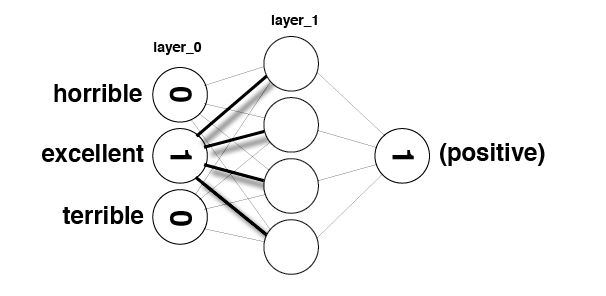

In [344]:
Image(filename='sentiment_network_sparse.png')

In [372]:
def get_most_similar_words(focus = "horrible"):
    most_similar = Counter()

    for word in mlp_full.word2index.keys():
        most_similar[word] = np.dot(mlp_full.weights_0_1[mlp_full.word2index[word]],mlp_full.weights_0_1[mlp_full.word2index[focus]])
        #print("1=", mlp_full.weights_0_1[mlp_full.word2index[word]],"2=",mlp_full.weights_0_1[mlp_full.word2index[focus]])
    return most_similar.most_common()

In [388]:
#mlp_full.weights_0_1
print("excellent=",mlp_full.weights_0_1[mlp_full.word2index['excellent']],
      "\n good=", mlp_full.weights_0_1[mlp_full.word2index['good']],
      "\n terrible=", mlp_full.weights_0_1[mlp_full.word2index['terrible']])


excellent= [ 0.15896251 -0.05986802 -0.05168821 -0.1050034   0.08469096 -0.22523435
  0.17075165 -0.07449362  0.03122197 -0.02440401] 
 good= [ 0.040982   -0.01543453 -0.0133257  -0.02707085  0.02183411 -0.0580675
  0.04402135 -0.01920514  0.00804931 -0.00629158] 
 terrible= [-0.12998612  0.04895501  0.04226626  0.08586292 -0.06925312  0.18417764
 -0.13962629  0.06091459 -0.02553069  0.01995554]


In [390]:
 np.dot(mlp_full.weights_0_1[mlp_full.word2index["good"]],mlp_full.weights_0_1[mlp_full.word2index["excellent"]])

0.035250130839512769

In [391]:
np.dot(mlp_full.weights_0_1[mlp_full.word2index["good"]],mlp_full.weights_0_1[mlp_full.word2index["poor"]])

-0.029245007425377355

In [395]:
get_most_similar_words("excellent")

[('excellent', 0.13672950757352481),
 ('perfect', 0.12548286087225946),
 ('amazing', 0.091827633925999741),
 ('today', 0.090223662694414231),
 ('wonderful', 0.089355976962214617),
 ('fun', 0.087504466674206874),
 ('great', 0.087141758882292031),
 ('best', 0.085810885617880639),
 ('liked', 0.077697629123843454),
 ('definitely', 0.076628781406966065),
 ('brilliant', 0.073423858769279066),
 ('loved', 0.073285428928122162),
 ('favorite', 0.072781136036160765),
 ('superb', 0.071736207178505068),
 ('fantastic', 0.070922191916266211),
 ('job', 0.069160617207634084),
 ('incredible', 0.066424077952614444),
 ('enjoyable', 0.065632560502888834),
 ('rare', 0.064819212662615089),
 ('highly', 0.063889453350970543),
 ('enjoyed', 0.06212754610181298),
 ('wonderfully', 0.062055178604090183),
 ('perfectly', 0.061093208811887408),
 ('fascinating', 0.060663547937493886),
 ('bit', 0.059655427045653076),
 ('gem', 0.059510859296156786),
 ('outstanding', 0.058860808147083027),
 ('beautiful', 0.058613934703162

In [396]:
for word, cnt in get_most_similar_words("terrible"):
    if cnt<0:
        print(word, cnt)
    else:
        pass

expierence -5.57270791179e-20
coris -5.57270791179e-20
alternante -5.57270791179e-20
patakin -5.57270791179e-20
tuckered -5.57270791179e-20
remission -2.23695190295e-17
enabler -2.23695190295e-17
emphasising -5.08927295089e-17
contactees -5.08927295089e-17
anxiousness -5.08927295089e-17
reductionism -5.08927295089e-17
inoculates -5.08927295089e-17
mccarthyite -5.08927295089e-17
manhandling -5.08927295089e-17
curative -5.08927295089e-17
satisfactions -5.08927295089e-17
stow -7.23025908164e-17
amrarcord -1.20825703539e-16
georgi -1.20825703539e-16
osenniy -1.20825703539e-16
gaiday -1.20825703539e-16
moskve -1.20825703539e-16
leonid -1.20825703539e-16
tillier -1.20825703539e-16
seryozha -1.20825703539e-16
marafon -1.20825703539e-16
paraszhanov -1.20825703539e-16
georgians -1.20825703539e-16
mimino -1.20825703539e-16
dza -1.20825703539e-16
shagayu -1.20825703539e-16
grusiya -1.20825703539e-16
manette -1.20825703539e-16
propashchiy -1.20825703539e-16
levan -1.20825703539e-16
sovsem -1.20825

tobei -1.50603271886e-10
bando -1.50603271886e-10
hisako -1.50603271886e-10
mitsugoro -1.50603271886e-10
miku -1.50603271886e-10
hatsu -1.50603271886e-10
teruyo -1.50603271886e-10
hallberg -1.54420385129e-10
impurest -1.54819776205e-10
fucky -1.54819776205e-10
blushy -1.54819776205e-10
independentcritics -1.54819776205e-10
aquilae -1.56756377079e-10
mainsequence -1.56756377079e-10
swinstead -1.59508504415e-10
bryans -1.63697881576e-10
contemptuously -1.68192985889e-10
nebulas -1.68192985889e-10
palettes -1.68192985889e-10
rousselot -1.70547270376e-10
reigne -1.70547270376e-10
bierstadt -1.70547270376e-10
sympathises -1.71908241016e-10
pascale -1.72103525539e-10
stuporous -1.72103525539e-10
esperance -1.72103525539e-10
rivault -1.72103525539e-10
trjan -1.72103525539e-10
romilda -1.72103525539e-10
unjaded -1.73784505938e-10
teetered -1.73784505938e-10
sardine -1.73784505938e-10
insector -1.74367449791e-10
souci -1.74367449791e-10
wordiness -1.74367449791e-10
interlocutor -1.74367449791e-

hampden -8.57077198971e-09
properness -8.59305084628e-09
ghostwritten -8.59305084628e-09
megawatt -8.59305084628e-09
softcover -8.59305084628e-09
mediumistic -8.60639285619e-09
fleashens -8.63280108888e-09
macmurphy -8.63280108888e-09
benjiman -8.63280108888e-09
airways -8.66723032599e-09
conformists -8.67023307927e-09
loder -8.67107263748e-09
wada -8.68114296869e-09
kaoru -8.68114296869e-09
cashew -8.68114296869e-09
pirotess -8.68114296869e-09
reintroduced -8.68114296869e-09
kashue -8.68114296869e-09
shiris -8.68114296869e-09
greevus -8.68114296869e-09
showstoppingly -8.68114296869e-09
ryna -8.68114296869e-09
zarustica -8.68114296869e-09
aldonova -8.68114296869e-09
hayami -8.68114296869e-09
tohma -8.68114296869e-09
kardis -8.68114296869e-09
garrack -8.68114296869e-09
muscari -8.68114296869e-09
deedlit -8.68114296869e-09
maar -8.68114296869e-09
hobb -8.68114296869e-09
slayn -8.68114296869e-09
diss -8.68114296869e-09
ghim -8.68114296869e-09
reona -8.68114296869e-09
ortiz -8.68114296869e

orin -7.94054604375e-08
starchaser -7.94054604375e-08
nekhron -7.94054604375e-08
meudon -7.98342134626e-08
maidservant -7.98342134626e-08
screecher -7.9875546313e-08
dominos -7.99435311124e-08
arnolds -8.0100576334e-08
worldliness -8.05527675192e-08
narayan -8.05643821797e-08
udit -8.05643821797e-08
kristopherson -8.06096407686e-08
icewater -8.09642585614e-08
catherines -8.09642585614e-08
defrost -8.09642585614e-08
jameses -8.09642585614e-08
maturely -8.15703392684e-08
ltd -8.19106439814e-08
glenaan -8.19106439814e-08
bate -8.21017294188e-08
pandia -8.28130830047e-08
itfa -8.28130830047e-08
hein -8.28130830047e-08
anbuchelvan -8.28130830047e-08
devadharshini -8.28130830047e-08
bgm -8.28130830047e-08
rajasekhar -8.28130830047e-08
balaji -8.28130830047e-08
jeevan -8.28130830047e-08
greico -8.28269665604e-08
studmuffins -8.28382712129e-08
derrek -8.28382712129e-08
infirmed -8.28382712129e-08
liposuction -8.28382712129e-08
vapidness -8.28382712129e-08
enchrenched -8.28382712129e-08
preem -

pv -4.53576244691e-07
macadder -4.53643383111e-07
kipper -4.53643383111e-07
restate -4.54256352972e-07
emeryville -4.55526401576e-07
autocracy -4.55526401576e-07
berkovits -4.56025789566e-07
soulhealer -4.56025789566e-07
beingness -4.56025789566e-07
nyberg -4.56025789566e-07
workouts -4.57802042898e-07
kibitz -4.57802042898e-07
nami -4.59775058513e-07
discriminatory -4.59775058513e-07
chepart -4.63288569419e-07
benecio -4.63288569419e-07
pluperfect -4.63458156828e-07
cpo -4.63458156828e-07
vocalizing -4.63458156828e-07
arfrican -4.64851936027e-07
influencee -4.64851936027e-07
joisey -4.66368988003e-07
kouzina -4.67531901912e-07
yiannis -4.67531901912e-07
exaggerative -4.67531901912e-07
politiki -4.67531901912e-07
symbolizations -4.67531901912e-07
zouganelis -4.67531901912e-07
filmrolls -4.69153168286e-07
albatross -4.69409449663e-07
troughs -4.70648861884e-07
undulating -4.70648861884e-07
rosier -4.70648861884e-07
lithium -4.70648861884e-07
padm -4.71487491275e-07
kudoh -4.71588332628e

stows -1.25340778094e-06
trueness -1.25401880599e-06
portals -1.25837632308e-06
slotnick -1.2584618591e-06
earing -1.26010713549e-06
fundraiser -1.26587077725e-06
lucianna -1.26914653979e-06
madeira -1.26914653979e-06
gaillardian -1.26914653979e-06
weightlifting -1.27227251473e-06
roundup -1.274362917e-06
rebuilding -1.27464387995e-06
exteremely -1.27616684358e-06
courttv -1.27982991276e-06
neutralize -1.28127021963e-06
spectacled -1.28130571026e-06
holmfrid -1.28365372501e-06
ilva -1.28365372501e-06
rahm -1.28365372501e-06
gossiper -1.28365372501e-06
paraso -1.28365372501e-06
sjberg -1.28365372501e-06
jhkel -1.28365372501e-06
lf -1.28365372501e-06
teorema -1.28365372501e-06
respiratory -1.28421392989e-06
hwl -1.28421392989e-06
disseminating -1.28421392989e-06
mutterings -1.28465461751e-06
undistinguishable -1.28465461751e-06
hifi -1.2857069306e-06
tractored -1.28690949774e-06
alleyways -1.2872898592e-06
feistiest -1.28790837641e-06
zinnemann -1.28790837641e-06
migrs -1.28790837641e-06

angeletti -3.04188511089e-06
crochety -3.04188511089e-06
naples -3.04188511089e-06
whiteley -3.04188511089e-06
leveler -3.05415469357e-06
beuneau -3.05415469357e-06
radlitch -3.05670430668e-06
taradash -3.05670502308e-06
mran -3.05805503842e-06
taing -3.05805503842e-06
uill -3.05805503842e-06
padruig -3.05805503842e-06
weavers -3.05805503842e-06
pinacle -3.05805503842e-06
gaels -3.05805503842e-06
juts -3.0720088622e-06
polack -3.0720088622e-06
godsend -3.07745803468e-06
forfeit -3.0780661734e-06
pharmacology -3.0780661734e-06
geno -3.0780661734e-06
swimmingly -3.0807358927e-06
starringsean -3.0807358927e-06
vilifyied -3.0807358927e-06
capeshaw -3.0807358927e-06
flordia -3.0807358927e-06
hazed -3.0807358927e-06
convoked -3.0807358927e-06
authorlittlehammer -3.0807358927e-06
watchably -3.0807358927e-06
villainously -3.0807358927e-06
tequila -3.08284720634e-06
fwwm -3.08485224799e-06
daugher -3.08485224799e-06
apathetic -3.08616725572e-06
ea -3.08988688494e-06
bandekar -3.09930506999e-06


larn -6.43816784527e-06
teegra -6.43817560918e-06
kilcher -6.44228614078e-06
whick -6.47052076329e-06
sttos -6.47052076329e-06
bratwurst -6.47715435246e-06
mapes -6.50107084495e-06
honkong -6.51350864366e-06
comedygenre -6.51350864366e-06
originating -6.51436070921e-06
noms -6.53055372486e-06
fictively -6.53055372486e-06
confound -6.54202585935e-06
shivam -6.5526954175e-06
counsels -6.56560905875e-06
scribblings -6.57422041385e-06
exporters -6.58067054095e-06
millardo -6.60055330941e-06
butcherer -6.60055330941e-06
nomm -6.60055330941e-06
dorlan -6.60055330941e-06
bucketloads -6.60055330941e-06
peacecraft -6.60055330941e-06
libra -6.60055330941e-06
guerre -6.60055330941e-06
keepin -6.60819417074e-06
flava -6.61364895339e-06
eazy -6.61364895339e-06
hearfelt -6.62901312398e-06
sires -6.6507938534e-06
interferring -6.6507938534e-06
plaage -6.6507938534e-06
unreservedly -6.65191707634e-06
malte -6.6600007282e-06
radditz -6.66001847496e-06
bleibteu -6.66001847496e-06
ihf -6.66001847496e-06


magalhes -1.24608477058e-05
seascape -1.25151647351e-05
benefitnot -1.25151647351e-05
costumesand -1.25151647351e-05
assestment -1.25202210719e-05
shure -1.25202210719e-05
vulkin -1.25202210719e-05
cavegirl -1.25202210719e-05
morneau -1.25476834802e-05
manucci -1.25476834802e-05
obstructions -1.25556631672e-05
thinked -1.25579879629e-05
disputable -1.258019723e-05
bottomed -1.25982115395e-05
sandhali -1.26053037077e-05
puroo -1.26053037077e-05
mussalmaan -1.26053037077e-05
vajpai -1.26053037077e-05
chattarjee -1.26053037077e-05
sinha -1.26053037077e-05
azam -1.26053037077e-05
banaras -1.26053037077e-05
lajjo -1.26053037077e-05
ramchand -1.26053037077e-05
mughal -1.26053037077e-05
triloki -1.26053037077e-05
torchon -1.26253496453e-05
potee -1.26253496453e-05
vento -1.26262857018e-05
palavras -1.26262857018e-05
braslia -1.26326866914e-05
actuelly -1.26952343724e-05
graft -1.26970539782e-05
splattery -1.27041706254e-05
gwenneth -1.2707443177e-05
ledge -1.27207655882e-05
thomsett -1.272219

conspired -2.2012890976e-05
agusti -2.20139046537e-05
giger -2.20208443253e-05
welliver -2.20725461928e-05
meitantei -2.20748178137e-05
myiazaki -2.20748178137e-05
sainik -2.20819993818e-05
sainthood -2.20819993818e-05
indepedence -2.20819993818e-05
holroyd -2.21157853055e-05
shep -2.21186802677e-05
mortuary -2.21444473272e-05
choreographers -2.21806645327e-05
towner -2.22561831475e-05
sinnister -2.22643566965e-05
sarlaac -2.22643566967e-05
fuelling -2.22834892769e-05
oiran -2.2285948672e-05
rancor -2.22893985714e-05
stephinie -2.23129591513e-05
crumbled -2.23517457979e-05
scrye -2.23631166197e-05
thematics -2.23916060384e-05
throng -2.24164891194e-05
vertes -2.24164892578e-05
lajo -2.24164892578e-05
corks -2.24164892578e-05
halima -2.24164892578e-05
biros -2.24164892578e-05
spaciousness -2.24164892578e-05
messel -2.24164892578e-05
wilpower -2.24276099553e-05
bilodeau -2.24282615314e-05
stphane -2.24282615314e-05
splendors -2.24351515385e-05
alexia -2.2467125954e-05
everythings -2.2479

duguay -3.54891887077e-05
whelan -3.54906553631e-05
tattersall -3.55129858174e-05
expatriates -3.55954238274e-05
yanquis -3.55954238274e-05
despondency -3.5600459632e-05
humanises -3.5600459632e-05
gujarat -3.5600459632e-05
shuttling -3.5600459632e-05
caricaturish -3.5600459632e-05
tex -3.56296521935e-05
rawked -3.56598803948e-05
clearence -3.56598803948e-05
subversion -3.5672388165e-05
miscalculate -3.56830471821e-05
geneseo -3.5780477686e-05
suny -3.5780477686e-05
arvide -3.57916934536e-05
adelade -3.57916934536e-05
videodisc -3.58072797034e-05
cobweb -3.5823108223e-05
anglophobe -3.58257901758e-05
beginner -3.5836840823e-05
muska -3.5859177055e-05
curved -3.58610257106e-05
rumanian -3.58744554934e-05
fomenting -3.59015663292e-05
pasqualino -3.6057724782e-05
melds -3.6071641348e-05
fratlike -3.60786874177e-05
settlements -3.60876946232e-05
rouse -3.61027721663e-05
complacency -3.61570674967e-05
singelton -3.61611615983e-05
pickard -3.61625914677e-05
doeesn -3.62238636791e-05
nwhere -

halloweed -5.34684802136e-05
opus -5.34700509346e-05
tenfold -5.34903113266e-05
demises -5.34910927595e-05
communicator -5.3506353274e-05
triumphantly -5.35154234529e-05
annihilated -5.35710927499e-05
embarrassments -5.35880009144e-05
reincarnate -5.36105999008e-05
wafers -5.3650486368e-05
rations -5.36709816094e-05
restarted -5.36712718542e-05
heavyhanded -5.36715038444e-05
stygian -5.36715038444e-05
ecologically -5.36715038444e-05
murkily -5.36715038444e-05
recapitulate -5.36715038444e-05
vampyr -5.36715038444e-05
conformism -5.3710460487e-05
rescues -5.37355969737e-05
sergent -5.37894875343e-05
rightness -5.38456758271e-05
lau -5.39202381612e-05
doozie -5.3927490494e-05
stynwyck -5.3927490494e-05
decorate -5.3941385878e-05
narrations -5.39435225837e-05
mangles -5.3960160469e-05
phibes -5.41645633381e-05
prototypes -5.4202014701e-05
szifrn -5.42029483331e-05
wraith -5.4235190284e-05
leaud -5.43273321216e-05
bulk -5.43572645848e-05
pts -5.44260685855e-05
repercussions -5.44350396174e-

jiminy -8.6038733688e-05
boheme -8.60605849881e-05
hrpuff -8.60693236069e-05
rushworth -8.60833695679e-05
stitchin -8.60941210284e-05
counsellor -8.61727293775e-05
scholarship -8.63498304125e-05
hentai -8.64059277199e-05
downy -8.64573114048e-05
burlesqued -8.64573114048e-05
cori -8.64573114048e-05
malaprops -8.64573114048e-05
walgreens -8.64605338863e-05
clunkers -8.67079997472e-05
eptoivoista -8.67339453139e-05
naista -8.67339453139e-05
kabaree -8.67339453139e-05
rakastin -8.67339453139e-05
jussi -8.67339453139e-05
wholehearted -8.6737625841e-05
unflaunting -8.6737625841e-05
bravest -8.6737625841e-05
unsuited -8.67694708081e-05
pigeon -8.67872921132e-05
negotiatior -8.67924102304e-05
misconduct -8.67924102304e-05
undeterred -8.67924102304e-05
emblematic -8.67987760787e-05
jf -8.68425832967e-05
reuniting -8.69129847237e-05
brusque -8.69139146274e-05
sift -8.69379617644e-05
reputable -8.69975592396e-05
egoist -8.70068242184e-05
phildelphia -8.70537210734e-05
reverence -8.706996344e-05


pleeease -0.000126492141385
corresponding -0.000126505030222
meiks -0.000126506117647
vivienne -0.000126544591932
preordained -0.000126604841986
dues -0.000126631240703
milano -0.000126632742385
hominid -0.000126894913677
unsexy -0.000126911755384
tennessee -0.000126936047169
superfighters -0.000126950834029
atta -0.000127229434384
livesey -0.000127246437612
tarrantino -0.000127318101045
quinten -0.000127318101045
dampens -0.000127318101045
cunninghams -0.000127318101045
newbie -0.000127411317143
ioana -0.000127441675598
democratically -0.000127614211673
domestically -0.000127624477107
ladybug -0.000127684960785
rationalist -0.00012770856005
offy -0.000127776559794
misspelling -0.000127776559794
beaubian -0.000127779255403
chagossian -0.000127780286564
provision -0.000127780286564
gombell -0.000127875284588
minna -0.000127875284588
molls -0.000127992676083
ghettoism -0.000127992676083
wharfs -0.000127992676083
laertes -0.000127995097411
herlie -0.000127995097411
tuscany -0.000127995097

misrepresented -0.000182923778044
barbedwire -0.000182933770112
surkin -0.000182933770112
imprisoned -0.000183009542015
snchez -0.000183109159385
violencememorably -0.000183170237924
aboriginals -0.000183379920138
trenton -0.000183401687268
paralyze -0.000183402253383
spool -0.000183402253383
commended -0.000183424405713
luxembourg -0.000183540735447
reprinted -0.000183840822052
prosecute -0.000183878701254
temperamental -0.000183998426196
schoolhouse -0.000184241438123
cubitt -0.000184265189643
signatures -0.000184272862305
scottie -0.000184275772881
kismet -0.000184412188755
horrizon -0.000184412188755
youe -0.000184441172776
titty -0.000184441172776
quintessence -0.000184540153849
bewitching -0.00018480604812
baldwins -0.000184860389523
sensitivities -0.000184952831897
bumblers -0.000185037434841
craftiness -0.000185049593999
likely -0.000185179847368
ity -0.000185195706265
savoured -0.000185227925006
unmannered -0.000185287119021
verifiably -0.000185377642944
conceding -0.000185377

divulges -0.000236767073523
overstated -0.000236788033927
functional -0.000236892014343
woolgathering -0.00023697134978
shorten -0.000237045221889
phases -0.000237100169829
enthrall -0.000237127597241
gripen -0.000237196592495
ews -0.000237196592495
jammer -0.000237196592495
mbb -0.000237196592495
hkp -0.000237196592495
ssg -0.000237196592495
napier -0.000237252985628
plants -0.000237261736185
alec -0.000237277833691
melchior -0.000237577630514
vaulted -0.000237645209847
unanimousness -0.000237662294271
sketchlike -0.000237662294271
innovatory -0.000237662294271
meanness -0.000237758899594
wui -0.000237828419082
hotwired -0.000237828419082
inauguration -0.000237996998399
authored -0.000238204177821
meecham -0.000238384183562
chambermaid -0.000238509609171
acerbic -0.000238521917175
expose -0.000238697446002
mummies -0.000238721458458
aborigone -0.000238750335214
aboriginies -0.000238750335214
rejuvenate -0.00023882505382
ashkenazi -0.000238837137397
phlegmatic -0.000238871298607
aparth

dracht -0.000325718245801
arcadia -0.000325743702478
dickens -0.000325765702013
roomy -0.000325789148469
deplorably -0.000326001484538
basements -0.0003262456344
vacationing -0.000326251040662
upkeep -0.0003264559619
chung -0.000326495557013
connerey -0.000326787255613
gaylord -0.000326853596602
seamstress -0.000327031727316
pascow -0.000327096896147
accomplishments -0.000327303184402
swd -0.000327344392271
reclining -0.000327410300692
milch -0.000327504578423
enlistment -0.000327711872858
masterpeice -0.000327743016048
hatchard -0.000327844437292
unfaithal -0.000327931655674
mourby -0.000327931655674
duda -0.000327969482141
berardinelli -0.0003280252856
fuzz -0.000328075565343
hermann -0.000328141453791
parlayed -0.000328210351738
trawling -0.000328231326344
leetle -0.000328231326344
helo -0.000328231326344
punt -0.000328231326344
bozo -0.000328256860829
upright -0.000328833990134
inconsolable -0.000328994408085
patriotic -0.000329234106513
morality -0.000329419047877
blabbermouth -0.

ashok -0.000413126814682
sown -0.000413154543552
spazzy -0.000413184302582
rc -0.000413249665113
thecoffeecoaster -0.000413297603716
imagesi -0.000413297603716
whackjobs -0.000413297603716
dales -0.000413504240589
thunderball -0.000413510791792
moralist -0.000413602670707
rennie -0.000413609977113
guccini -0.000413613413776
radioraptus -0.000413613413776
liga -0.000413613413776
dieci -0.000413613413776
rehash -0.000413677700516
dmz -0.00041370673754
parliamentary -0.000413783849144
drood -0.000413783849144
solicitors -0.000413783849144
testators -0.000413783849144
gentry -0.000413783849144
summerson -0.000413783849144
honoria -0.000413783849144
thackeray -0.000413783849144
coe -0.000413789419677
menopausal -0.000413847075676
typographic -0.000413970468856
matrimonial -0.000413970471022
rupert -0.000414147489365
defeatist -0.000414266114164
rahiyo -0.000414288538016
westernisation -0.000414288538016
bhangra -0.000414288538016
thare -0.000414288538016
necessitating -0.00041438478938
meer

bringer -0.000509893189459
shaaws -0.000509893189459
maharashtra -0.000509893189459
blackhawk -0.000509971769444
autographed -0.000509971769444
nablus -0.000510030144352
ethier -0.000510077203947
li -0.000510091593399
remoteness -0.000510091807349
gamine -0.000510098401173
cresus -0.000510147421051
sunsets -0.000510151364103
detonates -0.000510210971033
dawning -0.000510215420587
isareli -0.00051024853584
redoubled -0.00051024853584
procreate -0.00051024853584
bhave -0.000510274762828
marathi -0.000510274762828
uninvited -0.000510510165594
pump -0.000510632047441
patchwork -0.000510741711083
botches -0.000510845901136
assembling -0.000510898395126
superstitions -0.000510984753949
cookoo -0.000510992393007
americn -0.000510992393007
kewl -0.000511246673773
partridge -0.000511335525814
livin -0.000511543530244
palaces -0.000511612248082
bombeshells -0.000511635047377
wrinklies -0.000511713706394
descent -0.000511838044874
stateside -0.000511920016648
dentists -0.000511929068421
treeless 

gastaldi -0.000614058486842
dre -0.000614216678726
boen -0.000614464638753
bitty -0.000614616995494
gummy -0.000614629460185
quatermass -0.000614637723977
ulysses -0.000614654792415
touristy -0.00061469437183
riddle -0.000615113248013
cardboards -0.000615381523152
kingpins -0.000615422774797
hantz -0.000615422774797
caustic -0.000615486345533
rickles -0.000615787242334
title -0.000616269398805
synthetically -0.000616295263135
cheesefests -0.000616295263135
brgermeister -0.000616295263135
pov -0.000616352502138
sandbag -0.000616612331177
revoew -0.000616612331177
skyline -0.000616632763875
identi -0.000616761506226
baying -0.00061676537298
vic -0.000617008388987
connel -0.000617297838191
skits -0.000617326548008
transpired -0.000617414755589
jerrygary -0.000617469424313
roomis -0.000617469424313
caroles -0.000617469424313
colourised -0.000617469424313
menaces -0.000617509680707
homeliness -0.000617605457041
melvin -0.000617704925759
bocka -0.000617723194176
chronological -0.000618144403

ethic -0.000724319486363
probie -0.000724559623008
swimsuit -0.000724723708989
tilt -0.000724878138745
syndicate -0.000724897418093
averages -0.000724998705171
bolton -0.000725054961729
humoured -0.000725177748704
unignorable -0.000725249343344
baddest -0.000725728668781
sundry -0.000725752602449
rockies -0.000725806406092
prepares -0.000726044769849
hawkins -0.000726063928636
overseeing -0.000726218772493
newt -0.000726307259037
sanhedrin -0.000726322140014
definaetly -0.00072649596371
gallant -0.000726518374247
subtract -0.000726692267813
reinforce -0.000726712650189
nudes -0.000726747383142
lob -0.000726969517394
kellie -0.000727212029006
ra -0.000727249049866
referencing -0.000727388863495
bounded -0.000727922682584
borderline -0.000727975520153
flaming -0.000728040804787
kirge -0.000728566910226
timewise -0.000728744746265
timebomb -0.000728952409842
ebb -0.000729141014907
shrift -0.000729195219989
foreheads -0.000729225548601
reptilian -0.000729538465639
cataclysmic -0.0007295561

typecast -0.00082419712976
philosophic -0.00082420212554
gorges -0.000824264566518
dismembering -0.000824303824456
ramn -0.000824396469209
mattresses -0.000824719284324
giblets -0.000824719284327
hollyood -0.000824719284327
awestruck -0.000824958452842
burbs -0.000825053329693
horts -0.00082527706012
sadhashiv -0.000825482062064
kafi -0.000825482062064
absoulely -0.000825482062064
baap -0.000825482062064
nihlani -0.000825482062064
pquerette -0.000825705492902
iteration -0.000825786224666
lung -0.000825790890962
crocker -0.000825936478827
mccrea -0.000826236475788
weeping -0.000826241470424
friz -0.000826655048278
freleng -0.000826655048278
arch -0.000826731546999
poifect -0.000826912799218
chun -0.000826939369409
zhi -0.000826939369409
watershed -0.000827370740309
balkanized -0.000827525447382
beat -0.000827578943753
koontz -0.000827588136252
napkins -0.000827742664809
gentlemanlike -0.000827742664809
hobbiton -0.000827742664809
quipping -0.000828065606039
overdoes -0.000828089587174
w

musicly -0.000952853734245
granddaughters -0.000952885912971
heretic -0.000952961772524
filmfestival -0.000953053062604
stubborness -0.000953053590998
pitiable -0.000953361282626
unapologetic -0.000953702875709
ordering -0.000954390513941
afroamerican -0.000954482211194
jivetalking -0.000954482211194
occationally -0.000954482211194
goof -0.000954487339431
sep -0.000954632377194
testicles -0.000954711741534
atrocities -0.000955031452357
flexible -0.000955309118503
rutherford -0.000955564893263
flashdance -0.000955923382015
governmental -0.000955992314801
overenthusiastic -0.000956047807209
exercising -0.000956565741498
calderon -0.000956746911984
francoise -0.000957109304751
childishly -0.000957147625829
bolivians -0.000957260695461
motorcycling -0.000957260695461
aftershock -0.000957260695461
misfigured -0.000957260695461
onesidedness -0.000957260695461
confidentially -0.000957260695461
collaboration -0.000957356445441
elena -0.000958279442048
faschist -0.000958323853297
surpressors -0

grander -0.00108261109138
huns -0.00108332507054
copped -0.00108341340415
hatzisavvas -0.00108358436527
cessation -0.00108369304611
exhalation -0.00108369304611
surfboard -0.0010837007788
shedding -0.00108385918097
mccarten -0.00108433556377
tawa -0.00108433556377
loom -0.00108437562257
dalloway -0.00108440129448
affirming -0.00108491642293
pastor -0.00108509688859
bueller -0.0010852337286
headless -0.00108558924129
illustrations -0.00108579489364
homicidal -0.00108588890296
infancy -0.00108619429682
crisping -0.00108635483419
condenses -0.00108635483419
haigh -0.00108636138915
walbrook -0.00108647101806
schoolyard -0.0010864901173
heatwave -0.00108651511977
drained -0.00108665263344
preach -0.00108672536043
abduction -0.00108679513128
refute -0.00108686723289
baking -0.00108693694271
debts -0.00108701259613
access -0.00108705015637
epiphanal -0.00108705810286
loyalty -0.00108716680686
oratory -0.00108762136969
scullery -0.00108762146511
unarguably -0.00108813668817
mats -0.00108816751

realms -0.00120961002349
dicked -0.00120981510518
madhvi -0.00120989628623
rapeing -0.00120995487488
nakajima -0.00120995487488
aoi -0.00120995487488
misumi -0.00120995488955
kenji -0.00120997435351
cosmic -0.00121007189854
pernell -0.00121028001229
hoss -0.00121028128822
assaulting -0.00121030616717
comedienne -0.00121036334079
bathhouses -0.00121056113081
vivir -0.00121069943454
hongos -0.00121069943454
ferpecto -0.00121069943454
sonar -0.00121069943454
crimen -0.00121069943454
centimeters -0.00121069943454
busco -0.00121069943454
tujunga -0.00121069943454
octavia -0.00121069943454
insistently -0.00121070652193
growing -0.00121072094373
diversions -0.00121100743633
eros -0.00121127921882
moslems -0.00121140186297
cinderellas -0.00121164153002
shout -0.00121180129273
dolan -0.00121181344894
carpeting -0.00121209944646
outspoken -0.00121219868131
reginald -0.0012125809842
atmoshpere -0.00121269563909
connory -0.00121269563909
acknowledge -0.00121283525612
konkona -0.00121287323512
cons

faubourg -0.00134395910292
forthright -0.00134402966128
vampireslos -0.00134412351232
horrormovie -0.00134412351232
horrorfilm -0.00134412351232
repairman -0.00134426509622
fool -0.0013443117454
whoop -0.00134440428662
unloading -0.0013446767265
gruen -0.00134508418686
demarco -0.00134508418686
molds -0.00134560916844
xbox -0.00134578777528
unusal -0.00134581510414
amputee -0.00134585544958
nigh -0.00134623555661
lawsuits -0.00134653775369
ashura -0.00134689053864
youngs -0.00134691193095
bruiting -0.00134693202242
creamtor -0.00134693202242
hillermans -0.00134700442285
tink -0.0013470442504
glows -0.00134775185012
stuffed -0.00134779947554
spying -0.00134825223601
conquered -0.00134852176875
winners -0.00134856624352
meked -0.00134864090054
catharsic -0.00134864090054
shelli -0.00134873517068
bridgers -0.00134873517068
belasco -0.00134886645375
affects -0.00134888330773
upping -0.00134896680902
kuo -0.00134906524499
apperciate -0.00134906524499
chui -0.00134906524499
architect -0.0013

ringing -0.00147650001332
delicate -0.0014766331184
frying -0.00147669023613
mutha -0.00147688616801
batmans -0.00147696549872
benefiting -0.00147701246634
rohan -0.00147711165085
opposites -0.00147716404476
rasp -0.00147731439351
weasels -0.00147749467516
pretendeous -0.00147749983451
halflings -0.00147749983451
wizardy -0.00147749983451
presenation -0.00147749983451
kont -0.00147749983451
howerver -0.00147749983451
bambies -0.00147749983451
theoden -0.00147749983451
smeagol -0.00147749983451
mesmerizes -0.00147751818899
pettiness -0.00147761679664
supplying -0.0014776384669
paparazzi -0.00147771590208
hs -0.00147772955909
blunder -0.00147773582215
fellini -0.00147783861182
tragi -0.00147799696233
menzies -0.00147800218627
hollywod -0.00147803643336
dodie -0.00147820934499
perdita -0.00147820934499
denunciation -0.00147828899863
cinematographed -0.00147834031192
unfit -0.00147852613747
tote -0.00147868710149
majid -0.00147878426859
soweto -0.00147888632725
license -0.00147899488421
st

bending -0.00158324420961
lowering -0.00158341012836
denigrate -0.00158342677753
derated -0.00158349037518
pluckings -0.00158349037518
filmscore -0.00158349037518
recertified -0.00158349037518
shaadi -0.00158359673212
rupture -0.00158363113212
casars -0.00158363113212
childbearing -0.00158363113212
isthar -0.00158363821454
offshoots -0.00158363821454
hungering -0.00158368900242
segregated -0.0015837239082
contini -0.0015838036784
alfio -0.0015838036784
indelibly -0.00158383217901
maharaja -0.00158398568675
existience -0.00158398593757
glamous -0.00158398593757
scences -0.00158398593757
payments -0.00158402468603
buba -0.00158404643134
rietman -0.00158404643134
orignal -0.00158412019461
ecclesiastical -0.00158427646889
tractors -0.00158427646889
proposition -0.00158430288829
monstro -0.00158431413624
alterated -0.00158431413624
wishes -0.00158440504875
tovarish -0.00158442616632
lackey -0.00158462388602
matriarch -0.00158468930142
shroud -0.00158470168477
klingon -0.00158477962456
marus

amoung -0.00165314118093
beegees -0.00165314118093
grants -0.0016531528975
korda -0.00165337737003
bicarbonate -0.0016535218352
franic -0.00165367966186
violating -0.0016540119376
eritated -0.00165401614551
overexplanation -0.0016540620562
catalyzed -0.0016540620562
nacy -0.00165412731993
shelley -0.00165412823156
len -0.00165419327885
biases -0.00165432178506
trenches -0.00165435100369
pratt -0.00165457114568
cottontail -0.00165458560584
jennie -0.00165472714347
interrogation -0.00165476136888
bonita -0.00165487496943
granville -0.00165487496943
congressional -0.00165494223934
freudian -0.00165501891404
nephews -0.00165506508672
baits -0.00165513082536
militarily -0.00165513577258
sandal -0.00165521569214
malleson -0.00165539317334
smugglers -0.0016556206589
manhunter -0.00165564196218
transients -0.00165568755967
interestedly -0.00165589936959
giancaro -0.00165589936959
mimicked -0.0016559483342
charybdis -0.00165609746112
scylla -0.00165609746112
swineherd -0.00165609746112
eumaeus 

inexperienced -0.00177354372416
djinn -0.00177359476391
trafficker -0.0017738966149
thwart -0.00177410781613
widows -0.00177471051642
tipper -0.00177475868199
stomping -0.00177494893767
recognising -0.00177511558452
wastrel -0.00177548466262
wilfred -0.00177570662197
klever -0.00177574648264
hobos -0.00177616297336
doomed -0.0017765679752
thrives -0.00177657408543
lunkheads -0.00177665496285
existentialist -0.00177756027615
bubonic -0.00177764403114
pledge -0.00177781341406
quarterback -0.00177792481909
fothergill -0.00177797847931
rippner -0.00177831685696
undervalued -0.00177834708891
workmanship -0.00177879827503
kudisch -0.00177883770968
dieting -0.00177947149479
interprets -0.00178020503625
racking -0.00178027033673
juan -0.00178042829651
tormentors -0.00178057043889
vosloo -0.00178079058642
wire -0.00178129667315
ashoka -0.00178131717043
boerner -0.00178162477125
fisticuffs -0.00178182028095
kinugasa -0.00178188847603
prada -0.00178218274125
luster -0.00178235043097
wartime -0.00

kent -0.00209712059576
attained -0.00209738614058
barclay -0.00209759047993
serling -0.00209765440963
remix -0.00209849653666
overcrowded -0.00209851195884
diplomatic -0.00209873686817
wincott -0.00209873982973
ambushed -0.0020990033375
americana -0.00209904208234
assessments -0.00209990736821
borders -0.00210023173292
sardonically -0.00210095715874
normalcy -0.0021011513826
danes -0.0021017519235
wound -0.0021020324745
uninterested -0.00210206560981
geist -0.00210260760596
restrictive -0.00210263724906
affective -0.00210424923109
raina -0.00210460879484
geer -0.00210465252622
leaflets -0.00210526991504
williamson -0.00210608085493
syndication -0.00210625409726
epitomized -0.00210651545896
lambert -0.00210681578555
reassuring -0.00210687270749
checking -0.00210696978919
lynde -0.0021071294397
chapters -0.00210724278345
novotna -0.00210760885046
pimping -0.00210786723946
puffs -0.00210786772361
scarlet -0.002108376891
demonicus -0.00210858523861
supersedes -0.00210865400726
jealousies -

wiseguy -0.00249128567517
gussie -0.00249209153881
trains -0.00249395448928
vadis -0.0024940958245
matinee -0.00249417910901
fritz -0.00249434411122
naissance -0.00249550480895
pieuvres -0.00249550480895
snipers -0.00249568097086
erect -0.00249673773248
underlings -0.00249700893938
evangelist -0.00249836683761
weller -0.00249856125865
within -0.00249856832159
hilda -0.00249940169475
encouraged -0.00249971008477
disturbingly -0.00249989273061
abscond -0.00249990499456
chokes -0.00250088126311
sparks -0.00250137426962
borden -0.00250156762035
correspondence -0.00250222131744
aptitude -0.00250236817632
parcel -0.00250245436968
grifters -0.00250290557729
waw -0.00250335591498
brutality -0.00250431293261
polay -0.00250498087873
afore -0.00250578000196
reese -0.00250626086704
dirt -0.00250693352612
ring -0.0025080315248
jeffrey -0.00250847400807
bon -0.00250979074236
stalking -0.0025101279823
fingernails -0.0025103429558
witness -0.00251045731101
undetectable -0.00251104501208
joes -0.002512

endowments -0.00296685072059
overstatement -0.00296700854667
htm -0.00296801490908
scenarios -0.0029698323111
tones -0.00297035012388
longer -0.00297101974622
noire -0.00297145908998
moms -0.00297179222167
costuming -0.00297222537101
perfected -0.0029722645789
natured -0.00297253793051
hawaii -0.00297279548532
nwh -0.00297309203715
sidelined -0.00297336251354
tavern -0.00297409867011
respects -0.00297432986927
counting -0.00297444467716
wo -0.00297463627687
praiseworthy -0.00297495048111
waged -0.0029750285382
jaw -0.00297609519186
gunman -0.00297635238444
greeted -0.00297665274525
bikinis -0.00297674004285
simulation -0.0029768600126
toast -0.00297711385981
francois -0.00297804696877
glam -0.00297920031996
doolittle -0.00297922542016
dispensed -0.00297957247758
latter -0.00298046970426
sack -0.00298054098066
exuberance -0.00298092700745
shahrukh -0.0029812865785
prospero -0.0029819796699
japs -0.0029832238554
glorify -0.0029844094517
motorized -0.00298469475629
paused -0.0029874679774

liberties -0.00333545458246
thai -0.0033359720509
demolished -0.00333603688818
jos -0.0033362880554
uncovers -0.00333731810904
sneaks -0.00333839347756
recommendations -0.00333843137879
compellingly -0.0033394563826
revised -0.00334003583748
collide -0.00334010678376
exhibition -0.00334048904978
measured -0.00334094389973
wax -0.0033411532757
golem -0.0033415920587
surprise -0.00334167590367
milieu -0.00334201329544
complaining -0.00334295040937
batista -0.00334297703586
revolution -0.00334342032707
du -0.00334385559782
versailles -0.00334394647666
beckinsale -0.00334418012787
collapse -0.00334511475019
aviv -0.0033460769995
biased -0.00334611625862
bets -0.00334626164015
reign -0.00334758951489
wwii -0.00334763148227
observation -0.00334793031333
wachowski -0.00334794478777
gloom -0.00334858839115
goodbye -0.00335050399251
bye -0.00335075187495
frodo -0.00335130585928
maude -0.00335138134609
amounts -0.0033517173421
espisode -0.003352356879
sob -0.00335323608165
numerous -0.0033537076

stops -0.00399438464634
muse -0.00400268020871
panders -0.00400304060113
seidl -0.00400495586865
henderson -0.00400568732059
babes -0.00400571758389
brothel -0.00400574539682
polish -0.00400720745596
harlin -0.00400727067007
blends -0.0040074534314
curtiz -0.00400877727919
grossing -0.00400974770514
killian -0.00401033632742
irresistible -0.00401063541612
vulnerable -0.00401171676091
firing -0.00401482681924
pazu -0.00401541783972
granger -0.00401700482537
bounds -0.00401716539786
paired -0.004018298245
merciless -0.00401832949815
zodiac -0.00402069287785
marks -0.00402123588292
transform -0.00402152339294
remembered -0.00402154832236
suffering -0.00402173306228
knightley -0.00402210875293
drives -0.00402211086131
varies -0.00402310982771
toll -0.00402368177993
healing -0.00402378497874
millennium -0.00402386873514
lunacy -0.00402389270501
jessie -0.00402516786266
doom -0.00402517926531
radar -0.00402524733002
zillion -0.00402570631737
troopers -0.00402742158962
alexander -0.0040278710

hut -0.00512182828935
busey -0.00512323200501
doorway -0.00512338175056
wind -0.00512388715226
dealing -0.00512413702586
guitar -0.00512737082664
contributed -0.005130567109
kiefer -0.00513058025278
dominion -0.00513172351634
blazing -0.00513256970182
buzzer -0.00513369622422
ace -0.00513580706599
purchasing -0.00513701536092
visconti -0.00513751703073
represents -0.00513767456183
sanitized -0.00514376095999
sneaky -0.00514385183354
berserk -0.00514708834555
storms -0.00514922550614
excite -0.00515177691103
yeti -0.00515439135598
culture -0.00515801186315
harbor -0.00515813331615
brass -0.00516542911332
independent -0.00516578624291
unfolding -0.00516742649207
truth -0.00516759607576
convict -0.0051690871413
panic -0.00517090760075
taxi -0.00518039645993
colonial -0.00518046831252
overtly -0.00518241565601
happiness -0.00518605062381
forum -0.00518667200816
fireplace -0.00518683500173
clark -0.00518865162453
confidence -0.00518912267794
obsessed -0.00518996749809
cunning -0.00519229617

teaches -0.00760895288512
ladder -0.00760990976159
charity -0.00761002086369
animation -0.00761533763832
dad -0.00761542448239
continues -0.0076158854553
jacket -0.00761965774604
hart -0.00762199447144
recent -0.00762877952452
leave -0.00762956155989
dismissed -0.00763236425528
abused -0.00763830797068
jackson -0.00764189156999
principle -0.00764222090187
restraint -0.00764790347643
knew -0.00764804077395
forgot -0.00765571571923
informs -0.00765662074644
raise -0.0076592907231
avoids -0.00766240811494
evening -0.00766887770551
feat -0.00767626359291
conquest -0.00767634316134
craig -0.0076768710287
deliverance -0.0076788968763
slower -0.00768199193572
duchovny -0.00768749157163
recorded -0.00768752525128
dark -0.00769362530572
goods -0.0076960564604
adore -0.00770621893602
enchanting -0.00770800323291
mill -0.00771426567979
imaginative -0.00771889916587
rookie -0.0077204693937
california -0.00772585465394
morning -0.00772720741732
email -0.00773385507139
shape -0.00773587128956
interp

kennedy -0.0139527254074
treats -0.0139636105912
mel -0.0139671090372
existed -0.0139702553691
color -0.0139721065338
taking -0.0139847721596
answers -0.0139930554851
hoffman -0.0140025103146
known -0.0140396382413
dream -0.014052939511
recall -0.0140561322269
lonely -0.0140589617885
charm -0.0140681132566
score -0.0140835539813
ironic -0.0140858133416
sidney -0.0140966979219
collection -0.0141084830085
identify -0.014128057605
criticism -0.0141297645675
blake -0.0141325491456
fantasy -0.0141585299239
manager -0.0141772942115
twisted -0.0141814220972
awards -0.0141816966197
particular -0.0142123085918
kelly -0.014212546819
technology -0.0142404918218
awe -0.0142834034852
dancer -0.014311163887
technique -0.0143118750642
normally -0.0143192122878
intellectual -0.0143405640036
see -0.0143547632046
moves -0.0143588766565
craven -0.0143898429557
broke -0.0143931497782
chief -0.0143950357232
variety -0.0144069120368
realizes -0.0144072761908
anyway -0.0144539370583
keep -0.0144608097029
tra

In [394]:
get_most_similar_words("terrible")

[('worst', 0.16966107259049842),
 ('awful', 0.12026847019691242),
 ('waste', 0.11945367265311004),
 ('poor', 0.092758887574435483),
 ('terrible', 0.091425387197727914),
 ('dull', 0.084209271678223604),
 ('poorly', 0.081241544516042014),
 ('disappointment', 0.08006475962136872),
 ('fails', 0.078599773723337513),
 ('disappointing', 0.07733948548032335),
 ('boring', 0.077127858748012867),
 ('unfortunately', 0.075502449705859093),
 ('worse', 0.070601835364194648),
 ('mess', 0.070564299623590399),
 ('stupid', 0.069484822832543036),
 ('badly', 0.066888903666228572),
 ('annoying', 0.065687021903374151),
 ('bad', 0.06309381453757211),
 ('save', 0.06288059749586572),
 ('disappointed', 0.062692353812072846),
 ('wasted', 0.061387183028051275),
 ('supposed', 0.060985452957725166),
 ('horrible', 0.060121772339380097),
 ('laughable', 0.05869840628546763),
 ('crap', 0.05810452866788457),
 ('basically', 0.057218840369636155),
 ('nothing', 0.05715822004303419),
 ('ridiculous', 0.056905481068931438),
 (

In [348]:
import matplotlib.colors as colors

words_to_visualize = list()
for word, ratio in pos_neg_ratios.most_common(500):
    if(word in mlp_full.word2index.keys()):
        words_to_visualize.append(word)
    
for word, ratio in list(reversed(pos_neg_ratios.most_common()))[0:500]:
    if(word in mlp_full.word2index.keys()):
        words_to_visualize.append(word)

In [349]:
pos = 0
neg = 0

colors_list = list()
vectors_list = list()
for word in words_to_visualize:
    if word in pos_neg_ratios.keys():
        vectors_list.append(mlp_full.weights_0_1[mlp_full.word2index[word]])
        if(pos_neg_ratios[word] > 0):
            pos+=1
            colors_list.append("#00ff00")
        else:
            neg+=1
            colors_list.append("#000000")

In [350]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, random_state=0)
words_top_ted_tsne = tsne.fit_transform(vectors_list)

In [351]:
p = figure(tools="pan,wheel_zoom,reset,save",
           toolbar_location="above",
           title="vector T-SNE for most polarized words")

source = ColumnDataSource(data=dict(x1=words_top_ted_tsne[:,0],
                                    x2=words_top_ted_tsne[:,1],
                                    names=words_to_visualize,
                                    color=colors_list))

p.scatter(x="x1", y="x2", size=8, source=source, fill_color="color")

word_labels = LabelSet(x="x1", y="x2", text="names", y_offset=6,
                  text_font_size="8pt", text_color="#555555",
                  source=source, text_align='center')
p.add_layout(word_labels)

show(p)

# green indicates positive words, black indicates negative words